# Observation

[[53 51 48 46 42 38]
 [54 53 52 51 48 45]
 [51 52 53 52 51 51]
 [44 46 48 48 48 50]
 [30 32 32 32 33 36]
 [29 29 29 29 30 31]]


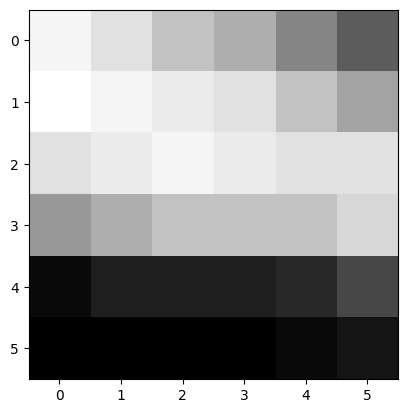

In [12]:
import cv2
from matplotlib import pyplot as plt

# Load your image
_noisyImg = cv2.imread('36_image.jpg', cv2.IMREAD_COLOR)
_noisyImg = cv2.cvtColor(_noisyImg, cv2.COLOR_BGR2GRAY)
plt.imshow(_noisyImg, cmap = 'gray')
print(_noisyImg)
(np.float64(_noisyImg)-_noisyImg[int(blk_size/2),int(blk_size/2)])


In [140]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)])
            matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])] = 0
            pass_num = 0
            for i in range(1, blk_size+1):
                if np.sort(matrix.flatten())[i-1] + np.sort(matrix.flatten())[-i] >=pass_threshold:
                    pass_num = pass_num+1
            if pass_num >= blk_size-1:
                # Your function code here
                    #print(matrix, count)
                location.append(count)
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(width)), (i-1)%(length))
        new_image[x][y] = 60
    return new_image

In [491]:
cut_and_process_image(_noisyImg,3)[0]

array([[ 0,  0,  0],
       [ 0, 53, 51],
       [ 0, 54, 53]], dtype=uint8)

In [490]:
matrix = np.float64( cut_and_process_image(_noisyImg,3)[0])-53
matrix[matrix == (0-_noisyImg[1,1])] = 0
matrix

array([[ 0.,  0.,  0.],
       [ 0.,  0., -2.],
       [ 0.,  1.,  0.]])

In [341]:
np.mean(_noisyImg)

42.97222222222222

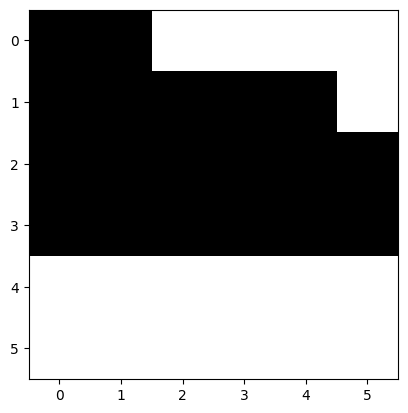

In [191]:

blk_size = 5
n_std = 1
pass_threshold = 2

new_image =  determind_and_merge_grids(_noisyImg,cut_and_process_image(_noisyImg, blk_size), n_std, pass_threshold)
plt.imshow(new_image, cmap = 'gray')

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

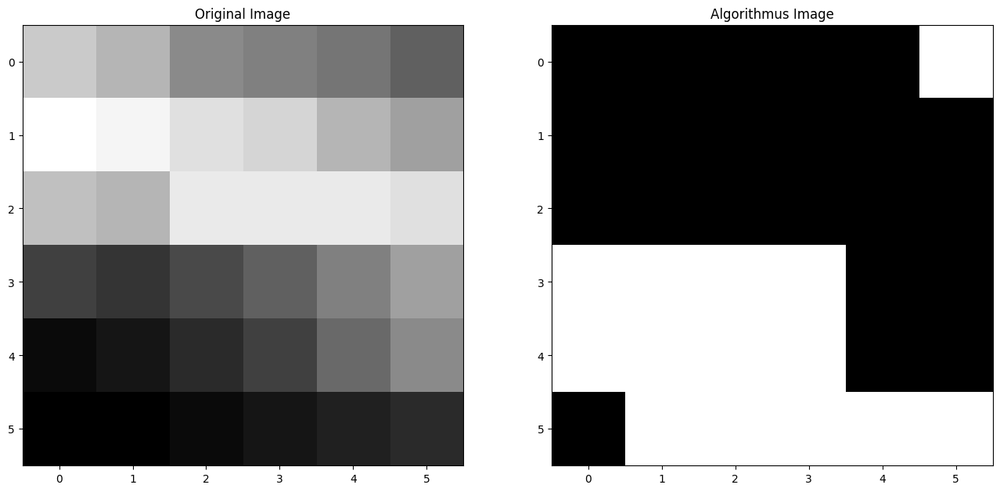

In [200]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image[416:422,86:92], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image[416:422,86:92], cmap='gray'), plt.title('Algorithmus Image')

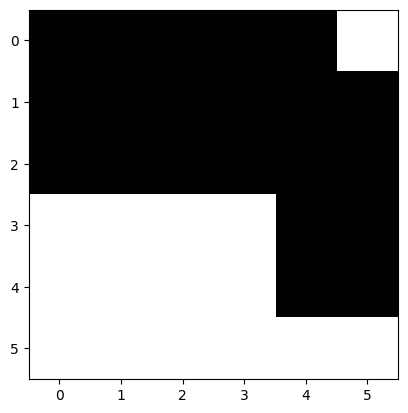

In [202]:
plt.imshow(new_image[416:422,86:92], cmap = 'gray')

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

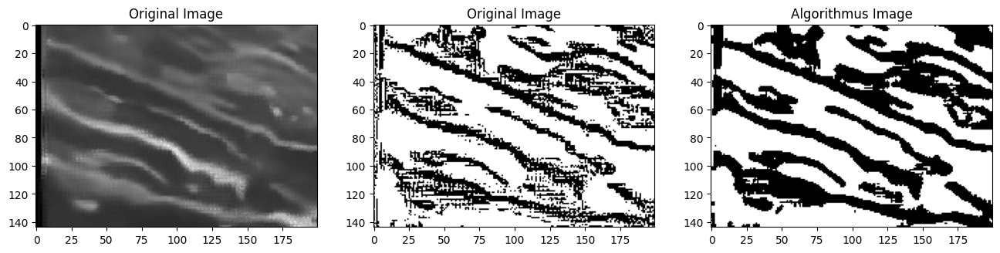

In [1042]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image[356:500,0:200], cmap='gray'), plt.title('Original Image')

plt.subplot(1, 3, 2), plt.imshow(masked_new_image[356:500,0:200], cmap='gray'), plt.title('Original Image')
plt.subplot(1,3,3), plt.imshow(reconstructed_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')


# select object plot pixels

In [781]:
from scipy.ndimage import label
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm
import numpy as np

def plot_colored_connected_components(image, connected_pixels):
    # Create a binary mask where 254 and 255 are considered as connected
    binary_mask = (image == 1)

    # Label connected components
    labeled_image, num_labels = label(binary_mask)

    label_counts = np.bincount(labeled_image.ravel())
    label_id = []

    # Find locations with more than 200 connected pixels
    for label_idx in range(1, num_labels + 1):
        component_location = np.argwhere(labeled_image == label_idx)

        if connected_pixels < len(component_location):
            print(f"Connected Component {label_idx}")
            label_id.append(label_idx)

    # Create a colormap with unique colors for each label id
    colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color
    custom_cmap = ListedColormap(colors(range(len(label_id) + 1)))

    # Create a color map for the labeled image
    color_map = np.zeros_like(labeled_image, dtype=float)
    for idx, label_idx in enumerate(label_id):
        color_map[labeled_image == label_idx] = idx + 1  # "+1" to avoid using 0 as a color

    # Display the image with different colors for each connected component
    plt.imshow(color_map, cmap=custom_cmap)
    plt.title('Merged Image of Selected Labels')
    # Annotate each connected component with its label id
    for idx, label_idx in enumerate(label_id):
        component_location = np.argwhere(labeled_image == label_idx)
        mean_location = np.mean(component_location, axis=0)
        plt.text(mean_location[1], mean_location[0], str(label_idx), color='black', fontsize=8, ha='center', va='center')

    # Show the plot
    plt.show()

# Example usage:
# plot_colored_connected_components(masked_new_image[356:500, 0:200] - 255, connected_pixels=200)


C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\1967622408.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color


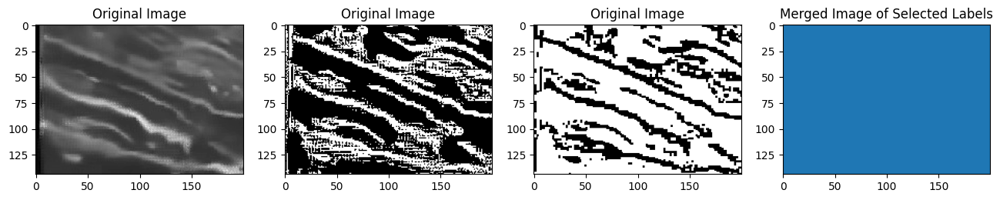

(<Axes: title={'center': 'Merged Image of Selected Labels'}>, None)

In [1045]:

# Your image data
# Display the merged image
plt.figure(figsize=(16, 16))
plt.subplot(1, 4, 1), plt.imshow(your_image[356:500,0:200], cmap='gray'), plt.title('Original Image')

plt.subplot(1, 4, 2), plt.imshow(masked_new_image[356:500,0:200]-1, cmap='gray'), plt.title('Original Image')

plt.subplot(1, 4, 3), plt.imshow(opening[356:500,0:200], cmap='gray'), plt.title('Original Image')

image = masked_new_image[356:500, 0:200] - 255
plt.subplot(1,4, 4), plot_colored_connected_components(image,800,254)


In [1086]:
from scipy.ndimage import label
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm
import numpy as np

def plot_colored_connected_components(image, connected_pixels, thresold):
    # Create a binary mask where 254 and 255 are considered as connected
    binary_mask = (image > thresold)

    # Label connected components
    labeled_image, num_labels = label(binary_mask)

    label_counts = np.bincount(labeled_image.ravel())
    label_id = []

    # Find locations with more than 200 connected pixels
    for label_idx in range(1, num_labels + 1):
        component_location = np.argwhere(labeled_image == label_idx)

        if connected_pixels < len(component_location):
            print(f"Connected Component {label_idx}")
            label_id.append(label_idx)

    # Create a colormap with unique colors for each label id
    colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color
    custom_cmap = ListedColormap(colors(range(len(label_id) + 1)))

    # Create a color map for the labeled image
    color_map = np.zeros_like(labeled_image, dtype=float)
    for idx, label_idx in enumerate(label_id):
        color_map[labeled_image == label_idx] = idx + 1  # "+1" to avoid using 0 as a color

    # Display the image with different colors for each connected component
    plt.imshow(color_map, cmap=custom_cmap)
    plt.title('Merged Image of Selected Labels')
    # Annotate each connected component with its label id
    for idx, label_idx in enumerate(label_id):
        component_location = np.argwhere(labeled_image == label_idx)
        mean_location = np.mean(component_location, axis=0)
        plt.text(mean_location[1], mean_location[0], str(label_idx), color='black', fontsize=8, ha='center', va='center')

    # Show the plot
    #plt.show()

# Example usage:
# plot_colored_connected_components(masked_new_image[356:500, 0:200] - 255, connected_pixels=200)


In [1050]:
width, length = your_image.shape
masked_your_image = np.copy(your_image)
for x in range(0, width):
    for y in range(0, length):
        if masked_new_image[x][y] == 255 and your_image[x][y] != 0:
            masked_your_image[x][y] = 0

Connected Component 11
Connected Component 13
Connected Component 16
Connected Component 22
Connected Component 23
Connected Component 42


C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\1967622408.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color


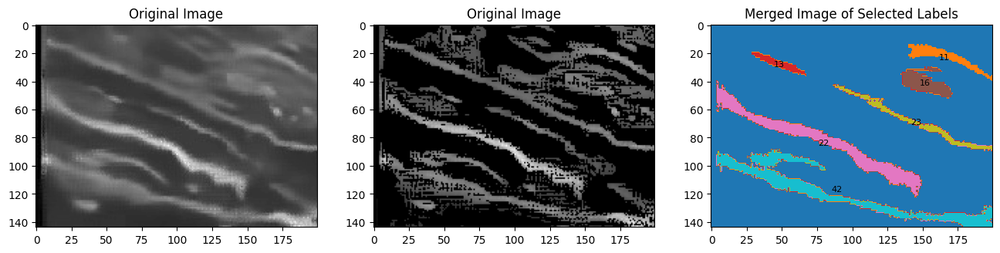

(<Axes: title={'center': 'Merged Image of Selected Labels'}>, None)

In [1059]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image[356:500,0:200], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow(masked_your_image[356:500,0:200], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 3), plot_colored_connected_components(your_image[356:500,0:200],100,55)

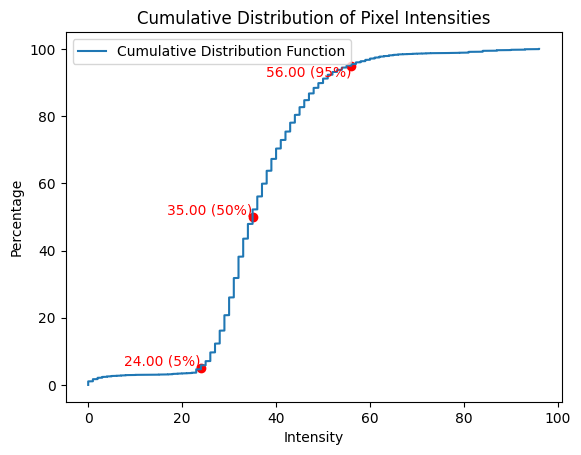

In [858]:
non_zero_pixels =enhance_intensity(your_image[356:500,0:200],final_image[356:500,0:200]-255).flatten()
# Calculate the cumulative distribution function (CDF)
non_zero_pixels = non_zero_pixels[non_zero_pixels<97]
sorted_pixels = np.sort(non_zero_pixels)
cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100

# Plot the CDF
plt.plot(sorted_pixels, cumulative_percentage, label='Cumulative Distribution Function')

# Calculate intensity values for 5% and 95%
intensity_005 = np.percentile(sorted_pixels, 5)
intensity_05 = np.percentile(sorted_pixels, 50)
intensity_095 = np.percentile(sorted_pixels, 95)

# Label points on the plot
plt.scatter([intensity_005,intensity_05, intensity_095], [5,50, 95], color='red')
plt.text(intensity_005, 5, f'{intensity_005:.2f} (5%)', verticalalignment='bottom', horizontalalignment='right', color='red')
plt.text(intensity_05, 50, f'{intensity_05:.2f} (50%)', verticalalignment='bottom', horizontalalignment='right', color='red')

plt.text(intensity_095, 95, f'{intensity_095:.2f} (95%)', verticalalignment='top', horizontalalignment='right', color='red')

# Add labels and title
plt.xlabel('Intensity')
plt.ylabel('Percentage')
plt.title('Cumulative Distribution of Pixel Intensities')
plt.legend()

plt.show()

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

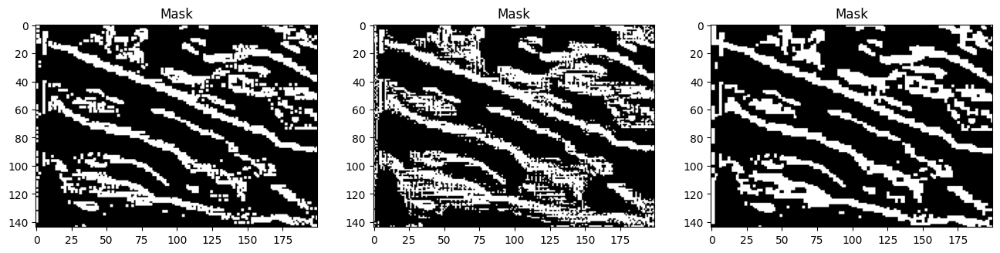

In [1060]:
plt.figure(figsize=(16, 16))

plt.subplot(1,3, 1),plt.imshow(closing[356:500,0:200]-1, cmap='gray'), plt.title('Mask')
plt.subplot(1, 3, 2),plt.imshow(final_image[356:500,0:200]-1, cmap='gray'), plt.title('Mask')
plt.subplot(1,3, 3),plt.imshow(opening[356:500,0:200]-1, cmap='gray'), plt.title('Mask')


(<matplotlib.image.AxesImage at 0x1803846db90>, Text(0.5, 1.0, 'original'))

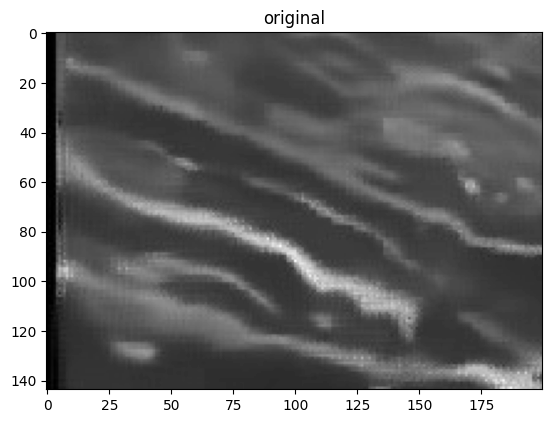

In [1088]:
plt.imshow(your_image[356:500,0:200], cmap='gray'), plt.title('original')


C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\60551485.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color


(<Axes: title={'center': 'opening'}>,
 Text(0.5, 1.0, 'opening'))

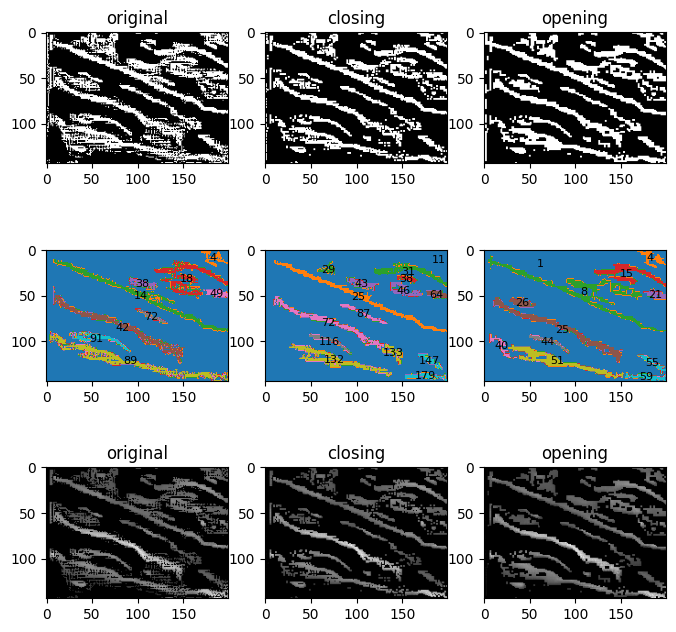

In [1087]:
plt.figure(figsize=(8, 8))
plt.subplot(3,3, 7), plt.imshow(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=final_image[356:500,0:200]-255), cmap='gray'), plt.title('original')
plt.subplot(3,3, 8), plt.imshow(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=closing[356:500,0:200]-255), cmap='gray'), plt.title('closing')
plt.subplot(3,3, 9), plt.imshow(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=opening[356:500,0:200]-255), cmap='gray'), plt.title('opening')
plt.subplot(3,3, 4), plot_colored_connected_components(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=final_image[356:500,0:200]-255),100,47)
plt.subplot(3,3, 5), plot_colored_connected_components(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=closing[356:500,0:200]-255),100,0)
plt.subplot(3,3, 6), plot_colored_connected_components(cv2.bitwise_and(your_image[356:500,0:200], your_image[356:500,0:200], mask=opening[356:500,0:200]-255),100,40)

plt.subplot(3, 3, 1),plt.imshow(final_image[356:500,0:200]-1, cmap='gray'), plt.title('original')
plt.subplot(3,3, 2),plt.imshow(closing[356:500,0:200]-1, cmap='gray'), plt.title('closing')
plt.subplot(3,3, 3),plt.imshow(opening[356:500,0:200]-1, cmap='gray'), plt.title('opening')


In [1114]:
from scipy.ndimage import label
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import cm
import numpy as np

def plot_colored_connected_components(image, connected_pixels, thresold):
    # Create a binary mask where 254 and 255 are considered as connected
    binary_mask = (image > thresold)

    # Label connected components
    labeled_image, num_labels = label(binary_mask)

    label_counts = np.bincount(labeled_image.ravel())
    label_id = []

    # Find locations with more than 200 connected pixels
    for label_idx in range(1, num_labels + 1):
        component_location = np.argwhere(labeled_image == label_idx)

        if connected_pixels < len(component_location):
            #print(f"Connected Component {label_idx}")
            label_id.append(label_idx)

    # Create a colormap with unique colors for each label id
    colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color
    custom_cmap = ListedColormap(colors(range(len(label_id) + 1)))

    # Create a color map for the labeled image
    color_map = np.zeros_like(labeled_image, dtype=float)
    for idx, label_idx in enumerate(label_id):
        color_map[labeled_image == label_idx] = idx + 1  # "+1" to avoid using 0 as a color
    print(len(label_id))
    # Display the image with different colors for each connected component
    plt.imshow(color_map, cmap=custom_cmap)


# Example usage:
# plot_colored_connected_components(masked_new_image[356:500, 0:200] - 255, connected_pixels=200)


109


C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\1304187742.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color


(<Axes: >, None)

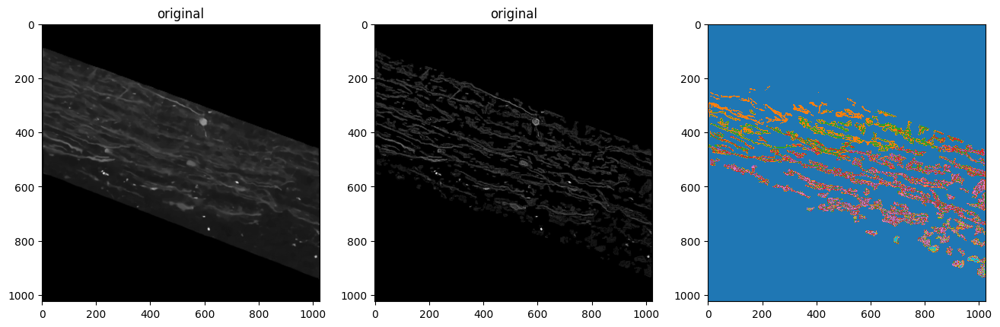

In [1115]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1),plt.imshow(your_image, cmap='gray'), plt.title('original')
plt.subplot(1,3, 2), plt.imshow(cv2.bitwise_and(your_image, your_image, mask=final_image-255), cmap='gray'), plt.title('original')
plt.subplot(1,3, 3), plot_colored_connected_components(cv2.bitwise_and(your_image, your_image, mask=final_image-255),200,0)


In [1111]:
from scipy.ndimage import label
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

def plot_colored_connected_components(image, connected_pixels, threshold):
    # Create a binary mask where values above the threshold are considered as connected
    binary_mask = (image > threshold)

    # Label connected components
    labeled_image, num_labels = label(binary_mask)

    label_counts = np.bincount(labeled_image.ravel())
    label_id = []

    # Find locations with more than 'connected_pixels' connected pixels
    for label_idx in range(1, num_labels + 1):
        component_location = np.argwhere(labeled_image == label_idx)

        if connected_pixels < len(component_location):
            # print(f"Connected Component {label_idx}")
            label_id.append(label_idx)

    # Calculate the number of rows and columns for the subplot grid
    num_subplots = len(label_id)
    num_cols = 4
    num_rows = -(-num_subplots // num_cols)  # Equivalent to math.ceil(num_subplots / num_cols)

    # Create the subplot grid
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    # Flatten the axs array if it's not 1-dimensional
    axs = axs.flatten() if num_rows > 1 else [axs]

    # Create a color map for the labeled image and plot each subplot
    for idx, label_idx in enumerate(label_id):
        color_map = np.zeros_like(labeled_image, dtype=float)
        color_map[labeled_image == label_idx] = idx + 1  # "+1" to avoid using 0 as a color

        # Display the image with different colors for each connected component in a subplot
        axs[idx].imshow(color_map, cmap='viridis')
        axs[idx].set_title(f'Label {label_idx}')

    # Hide any remaining empty subplots
    for i in range(num_subplots, num_rows * num_cols):
        axs[i].axis('off')

    # Show the subplots
    plt.show()

# Example usage:
# plot_colored_connected_components(masked_new_image[356:500, 0:200] - 255, connected_pixels=10, threshold=0)


<Figure size 1200x5000 with 0 Axes>

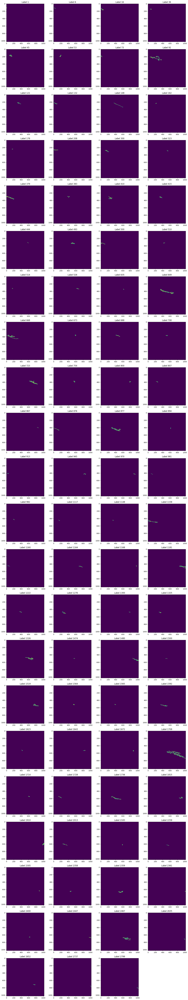

In [1112]:
plt.figure(figsize=(12, 50))  # Adjust the figure size as needed
plot_colored_connected_components(cv2.bitwise_and(your_image, your_image, mask=final_image-255),200,30)

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

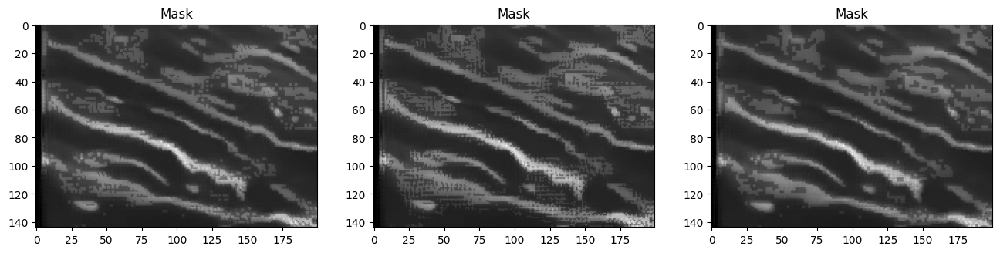

In [883]:
plt.figure(figsize=(16, 16))

plt.subplot(1,3, 1),plt.imshow(enhance_intensity(your_image[356:500,0:200],closing[356:500,0:200]-255), cmap='gray'), plt.title('Mask')
plt.subplot(1, 3, 2),plt.imshow(enhance_intensity(your_image[356:500,0:200],final_image[356:500,0:200]-255), cmap='gray'), plt.title('Mask')
plt.subplot(1,3, 3),plt.imshow(enhance_intensity(your_image[356:500,0:200],opening[356:500,0:200]-255), cmap='gray'), plt.title('Mask')


Connected Component 11
Connected Component 13
Connected Component 21
Connected Component 26
Connected Component 27
Connected Component 52
Connected Component 53


C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\1967622408.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("tab10", len(label_id) + 1)  # "+1" for background color


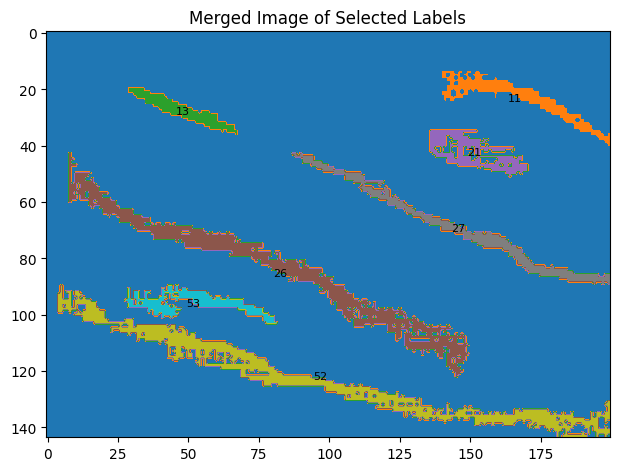

Connected Component 2
Connected Component 6
Connected Component 59
Connected Component 68
Connected Component 72
Connected Component 99
Connected Component 151
Connected Component 165
Connected Component 167
Connected Component 231
Connected Component 248


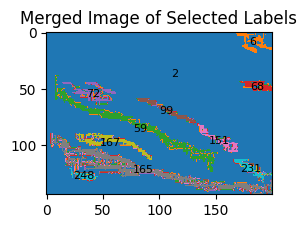

(<Axes: title={'center': 'Merged Image of Selected Labels'}>, None)

In [964]:
plt.figure(figsize=(16, 16))
plt.subplot(1,2, 1), plot_colored_connected_components(enhance_intensity(your_image[356:500,0:200],final_image[356:500,0:200]-255),100,11)
#plt.subplot(1,3, 1),plt.imshow(enhance_intensity(your_image[356:500,0:200],bg_rate[356:500,0:200]<=0.7), cmap='gray'), plt.title('Mask')
plt.subplot(1,2, 2), plot_colored_connected_components(final_image[356:500,0:200]-1,100,254)


# Algorithmus though

Since we know that the egde could be observe is because the edge is located in the middle of bright part and dimmer part, here I call it 'transition part'. Currently, the majority methods to identify the edge is done by setting the low threshold and high threshold. Here takes canny edge detection for example. The part that higher than high threshold will be detected as strong edge and lower than low threshold is background. The intensities that between low threshold and high threshold will be identity as weak edge. However, the method is not suitable for our image. There are too many weakly express axons, like 'stage 2 axon'. It could be hard to recognize.

**The thoughs of my algorithmus:**

Through comparing the intensity of surrending pixels to get the 

In [6]:
import numpy as np
import cv2
from itertools import combinations
from matplotlib import pyplot as plt


def cut_and_process_image(image, blk_size):
    # Step 1: Cut the 1024x1024 image into 6x6 pieces
    width, length= image.shape
    distance = int(blk_size/2)
    new_image =  255 * np.ones((width+distance*2, length+distance*2), dtype='uint8')

# Copy the original 6x6 image to the center of the new 7x7 array
    new_image[distance:width+distance, distance:length+distance] = image

# Print the result
# print(new_image)
    pieces = []
    for i in range(distance, width+distance):
        for j in range(distance,length+distance):
            piece = new_image[i-distance:i+distance+1, j-distance:j+distance+1]
           # if piece.shape != (blk_size, blk_size):
                
            pieces.append(piece)
    
    return pieces

## Vesion 1

In [32]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)])**2
            matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])**2] = 0
            # 有一個更簡潔的方法可以實現你的需求，使用 itertools 的 combinations 函數來生成所有可能的條件組合。
            stand = np.std(i[i>0])*n_std
            #print(stand, matrix)
            # 假設你有8個條件，分別是 condition_1, condition_2, ..., condition_8
            all_conditions = [matrix[blk_size//2-1,blk_size//2] > stand, #up
                              matrix[blk_size//2+1,blk_size//2] > stand, #down
                              matrix[blk_size//2,blk_size//2+1] > stand, #right
                              matrix[blk_size//2,blk_size//2-1] > stand, #left 
                              matrix[blk_size//2+1,blk_size//2+1] > stand, #down right
                              matrix[blk_size//2+1,blk_size//2-1] > stand, #down left
                              matrix[blk_size//2-1,blk_size//2+1] > stand, #up right
                              matrix[blk_size//2-1,blk_size//2-1] > stand #up left
                             ]

          
            # 生成所有可能的條件組合
            condition_combinations = list(combinations(all_conditions, pass_threshold))
            # 檢查任何一個條件組合是否滿足

            for condition_set in condition_combinations:
                true_count = sum(condition_set)
                #print(true_count)
                # 如果任意3個條件通過，執行以下代碼
                if true_count >= pass_threshold:
                # Your function code here
                    #print(matrix, count)
                    location.append(count)
                    break
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(width)), (i-1)%(length))
        new_image[x][y] = 60
    return new_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

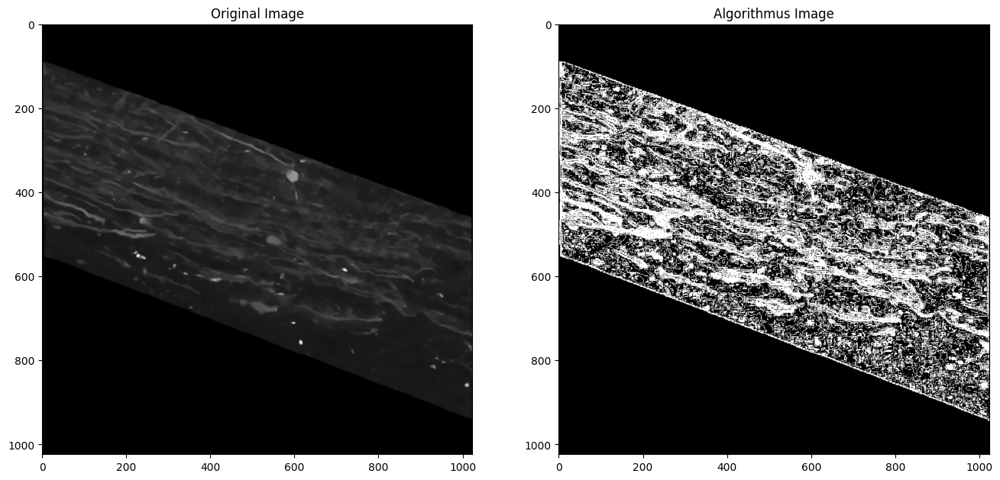

In [34]:
# Example usage:
# Assuming 'your_image' is your 1024x1024 grayscale image
# Make sure to replace 'your_image' with your actual image array
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)

blk_size = 5
n_std = 1.5
pass_threshold = 3

new_image =  determind_and_merge_grids(your_image,cut_and_process_image(your_image, blk_size), n_std, pass_threshold)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image, cmap='gray'), plt.title('Algorithmus Image')

## Vesion 2
difference**2 > mean(difference**2)

In [35]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)**2])
            matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])**2] = 0
            # 有一個更簡潔的方法可以實現你的需求，使用 itertools 的 combinations 函數來生成所有可能的條件組合。
            #stand = np.std(i[i>0])*n_std
            #print(stand, matrix)
            mean = np.mean(matrix[matrix>0])
            
            # 假設你有8個條件，分別是 condition_1, condition_2, ..., condition_8
            all_conditions = [matrix[blk_size//2-1,blk_size//2] > mean, #up
                              matrix[blk_size//2+1,blk_size//2] > mean, #down
                              matrix[blk_size//2,blk_size//2+1] > mean, #right
                              matrix[blk_size//2,blk_size//2-1] > mean, #left 
                              matrix[blk_size//2+1,blk_size//2+1] > mean, #down right
                              matrix[blk_size//2+1,blk_size//2-1] > mean, #down left
                              matrix[blk_size//2-1,blk_size//2+1] > mean, #up right
                              matrix[blk_size//2-1,blk_size//2-1] > mean #up left
                             ]

            
            # 生成所有可能的條件組合
            condition_combinations = list(combinations(all_conditions, pass_threshold))
            # 檢查任何一個條件組合是否滿足

            for condition_set in condition_combinations:
                true_count = sum(condition_set)
                #print(true_count)
                # 如果任意3個條件通過，執行以下代碼
                if true_count >= pass_threshold:
                # Your function code here
                    #print(matrix, count)
                    location.append(count)
                    break
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(width)), (i-1)%(length))
        new_image[x][y] = 60
    return new_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

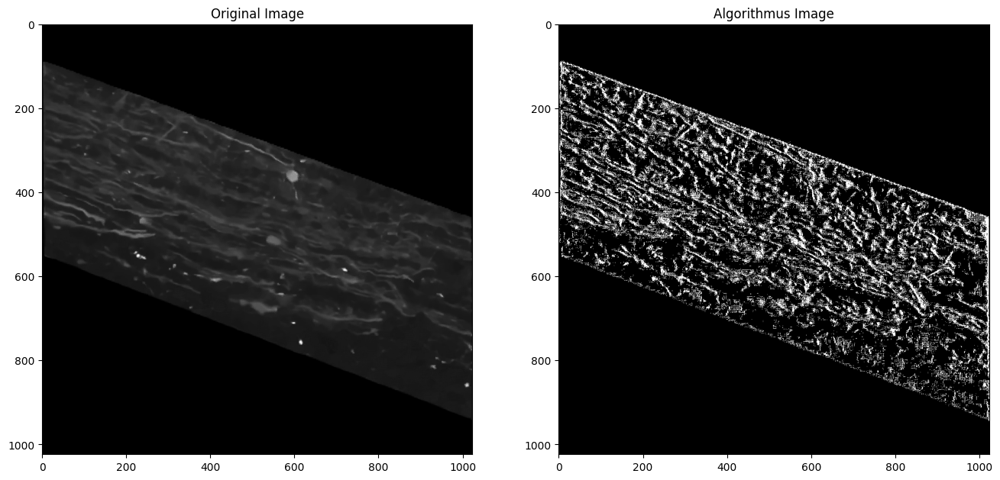

In [36]:
# Example usage:
# Assuming 'your_image' is your 1024x1024 grayscale image
# Make sure to replace 'your_image' with your actual image array
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)

blk_size = 5
n_std = 1
pass_threshold = 2

new_image =  determind_and_merge_grids(your_image,cut_and_process_image(your_image, blk_size), n_std, pass_threshold)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image, cmap='gray'), plt.title('Algorithmus Image')

## Version 3
half pixels intensity > the center pixel

In [37]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)])
            #matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])**2] = 0
            # 有一個更簡潔的方法可以實現你的需求，使用 itertools 的 combinations 函數來生成所有可能的條件組合。
            #stand = np.std(i[i>0])*n_std
            #print(stand, matrix)
            #mean = np.mean(matrix[matrix>0])
            
            # 假設你有8個條件，分別是 condition_1, condition_2, ..., condition_8
            all_conditions = [matrix[blk_size//2-1,blk_size//2] > 0, #up
                              matrix[blk_size//2+1,blk_size//2] > 0, #down
                              matrix[blk_size//2,blk_size//2+1] > 0, #right
                              matrix[blk_size//2,blk_size//2-1] > 0, #left 
                              matrix[blk_size//2+1,blk_size//2+1] > 0, #down right
                              matrix[blk_size//2+1,blk_size//2-1] > 0, #down left
                              matrix[blk_size//2-1,blk_size//2+1] > 0, #up right
                              matrix[blk_size//2-1,blk_size//2-1] > 0 #up left
                             ]

            
            # 生成所有可能的條件組合
            condition_combinations = list(combinations(all_conditions, pass_threshold))
            # 檢查任何一個條件組合是否滿足

            for condition_set in condition_combinations:
                true_count = sum(condition_set)
                #print(true_count)
                # 如果任意3個條件通過，執行以下代碼
                if true_count >= pass_threshold:
                # Your function code here
                    #print(matrix, count)
                    location.append(count)
                    break
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(width)), (i-1)%(length))
        new_image[x][y] = 60
    return new_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

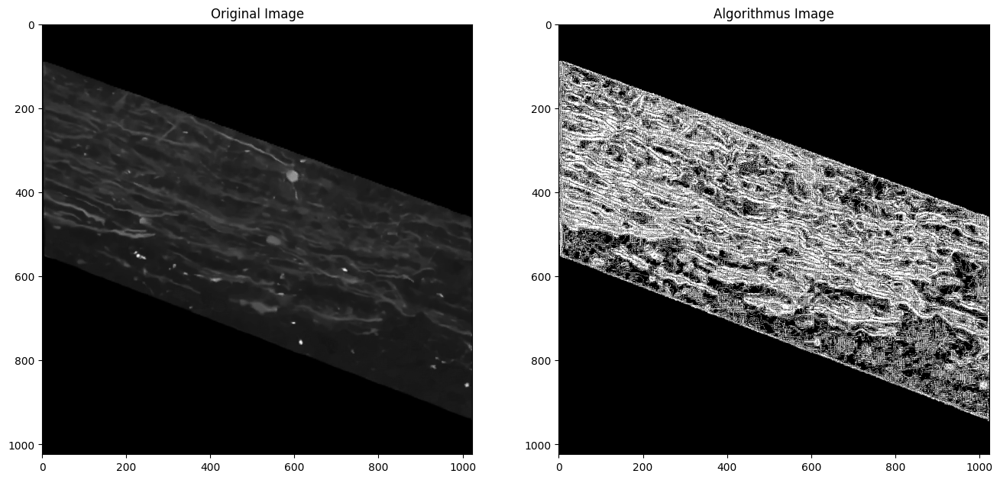

In [79]:
# Example usage:
# Assuming 'your_image' is your 1024x1024 grayscale image
# Make sure to replace 'your_image' with your actual image array
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)

blk_size = 5
n_std = 1
pass_threshold = 3

new_image =  determind_and_merge_grids(your_image,cut_and_process_image(your_image, blk_size), n_std, pass_threshold)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image, cmap='gray'), plt.title('Algorithmus Image')

## Version 4
max difference - min difference >4

In [563]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)])
            matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])] = 0
            # 有一個更簡潔的方法可以實現你的需求，使用 itertools 的 combinations 函數來生成所有可能的條件組合。
            #stand = np.std(i[i>0])*n_std
            #print(stand, matrix)
            #mean = np.mean(matrix[matrix>0])
            
            # 假設你有8個條件，分別是 condition_1, condition_2, ..., condition_8
            
            if matrix.max() + matrix.min() >= pass_threshold:
                # Your function code here
                    #print(matrix, count)
                location.append(count)
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(width)), (i-1)%(length))
        new_image[x][y] = 60
    return new_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

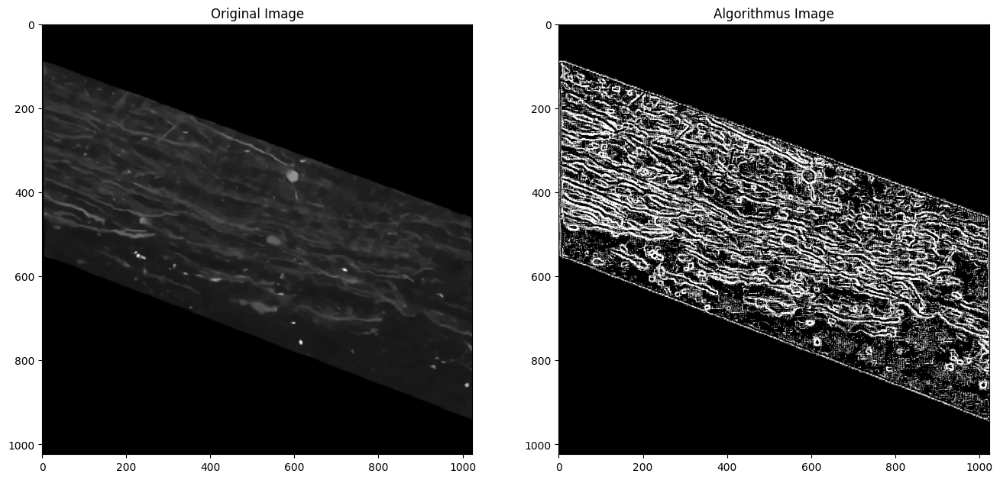

In [564]:
# Example usage:
# Assuming 'your_image' is your 1024x1024 grayscale image
# Make sure to replace 'your_image' with your actual image array
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)

blk_size = 5
n_std = 1
pass_threshold = 2

new_image =  determind_and_merge_grids(your_image,cut_and_process_image(your_image, blk_size), n_std, pass_threshold)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image, cmap='gray'), plt.title('Algorithmus Image')

## Version 5

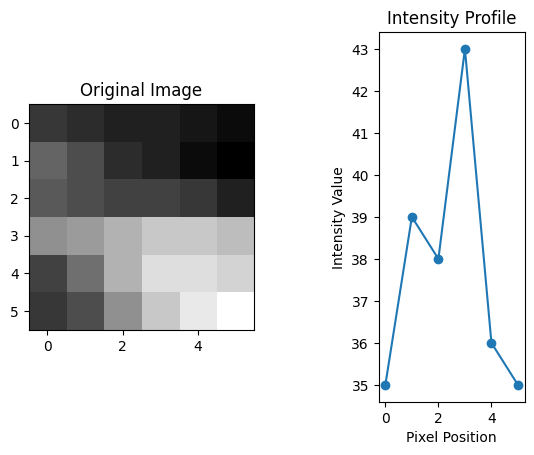

In [1020]:
import numpy as np
import matplotlib.pyplot as plt
plt.subplot(1, 2, 1), plt.imshow(your_image[412:418, 80:86], cmap='gray'), plt.title('Original Image')

# Extract the intensity values and create corresponding x-axis values
intensity_values = your_image[412:418, 80:86][:,0].flatten()
x_values = np.arange(len(intensity_values))

# Plot the intensity profile
plt.subplot(1, 3, 3), plt.plot(x_values, intensity_values, marker='o', linestyle='-')

# Set labels and title
plt.xlabel('Pixel Position')
plt.ylabel('Intensity Value')
plt.title('Intensity Profile')

# Show the plot
plt.show()


array([[35, 34, 33, 33, 32, 31],
       [39, 37, 34, 33, 31, 30],
       [38, 37, 36, 36, 35, 33],
       [43, 44, 46, 48, 48, 47],
       [36, 40, 46, 50, 50, 49],
       [35, 37, 43, 48, 51, 53]], dtype=uint8)

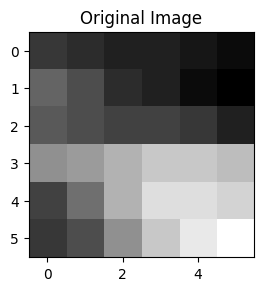

In [995]:
plt.subplot(1, 2, 1), plt.imshow(your_image[412:418, 80:86], cmap='gray'), plt.title('Original Image')
your_image[412:418, 80:86][:,0]


In [317]:
def determind_and_merge_grids(original_image,image_pieces, n_std, pass_threshold):
    width, length= original_image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    location=[]
    blk_size = len(image_pieces[0])
    count = 1
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            matrix = (np.float64(i)-i[int(blk_size/2),int(blk_size/2)])
            matrix[matrix == (0-i[int(blk_size/2),int(blk_size/2)])] = 0
            # 有一個更簡潔的方法可以實現你的需求，使用 itertools 的 combinations 函數來生成所有可能的條件組合。
            #stand = np.std(i[i>0])*n_std
            #print(stand, matrix)
            #mean = np.mean(matrix[matrix>0])
            
            # 假設你有8個條件，分別是 condition_1, condition_2, ..., condition_8
            pass_num = 0
            for i in range(1, blk_size+1):
                if np.sort(matrix.flatten())[i-1] + np.sort(matrix.flatten())[-i] >=pass_threshold:
                    pass_num = pass_num+1
            if pass_num >= blk_size-1:
                # Your function code here
                    #print(matrix, count)
                location.append(count)
        count = count +1

    for i in location:
        (x, y) = (int((i-1)/(length)), (i-1)%(length))
        new_image[x][y] = 255
    return new_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

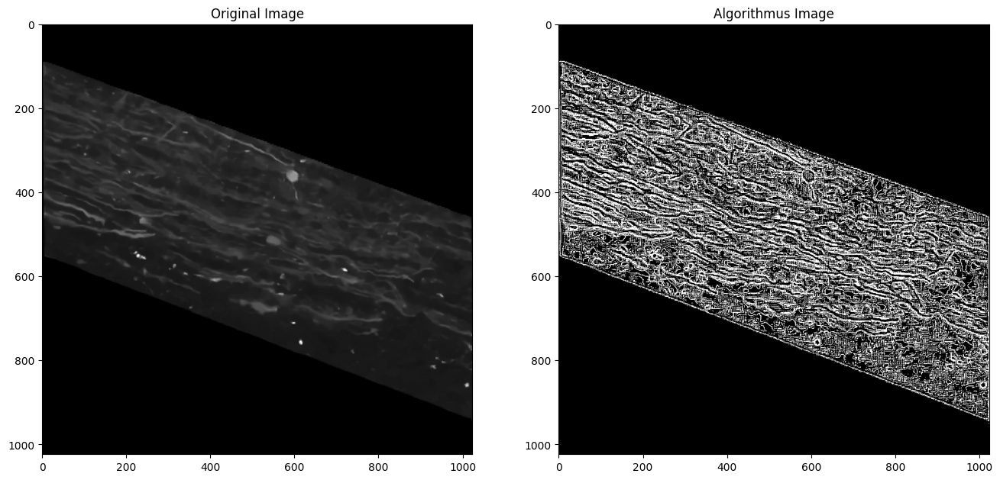

In [86]:
# Example usage:
# Assuming 'your_image' is your 1024x1024 grayscale image
# Make sure to replace 'your_image' with your actual image array
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)

blk_size = 5
n_std = 1
pass_threshold = 1

new_image =  determind_and_merge_grids(your_image,cut_and_process_image(your_image, blk_size), n_std, pass_threshold)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(new_image, cmap='gray'), plt.title('Algorithmus Image')

# detect_background

In [1027]:
import math
def detect_background(big_image_pieces,image_pieces):
    #plt.figure(figsize=(8, 4))
    #plt.subplot(1, 2, 1)
    #counts, edges, bars = plt.hist(big_image_pieces[big_image_pieces != 0])
    #plt.bar_label(bars)
    counts, edges = np.histogram(big_image_pieces[big_image_pieces != 0])

    # Find the index of the maximum count
    max_count_index = np.argmax(counts)

    # Print the information about the bin with the highest count
    #print(f"Highest Count: {counts[max_count_index]}" + f", Bin with Highest Count: {max_count_index + 1}"+ f", Range of the Bin: {edges[max_count_index]:.2f} to {edges[max_count_index + 1]:.2f}")
    #print(f"The threshold for background will be {edges[max_count_index + 1]}")
    threshold = edges[max_count_index + 1]
    
    width, length= big_image_pieces.shape
    back_ground = np.zeros((width, length), dtype='uint8')
    threshold_blk=[]# The number of each small n*n pieces that pass the index of the maximum count 
    
    location=[]
    blk_size = len(image_pieces[0])
    for i in image_pieces:
        if i[int(blk_size/2),int(blk_size/2)] != 0:
            threshold_blk.append(sum(i.flatten()<threshold))

    #plt.subplot(1, 2, 2)
    #counts, edges, bars = plt.hist(threshold_blk)
    #plt.bar_label(bars)

    median_value = np.median(threshold_blk) # the medain number of each small n*n pieces that pass the index of the maximum count 
    
    # Print the result
    #print(f"The median of the data is: {median_value}")
    
    count = 1
    for i in image_pieces:
        if sum(i.flatten()<threshold) > math.ceil(median_value)-1 :
                # Your function code here
                #print(i, count)
            location.append(count)
        count = count +1
    
    for i in location:
        (x, y) = (int((i-1)/(length)), (i-1)%(length))
        #print(i, x, y)
        back_ground[x][y] = 255
    return back_ground

IndexError: index 50 is out of bounds for axis 0 with size 50

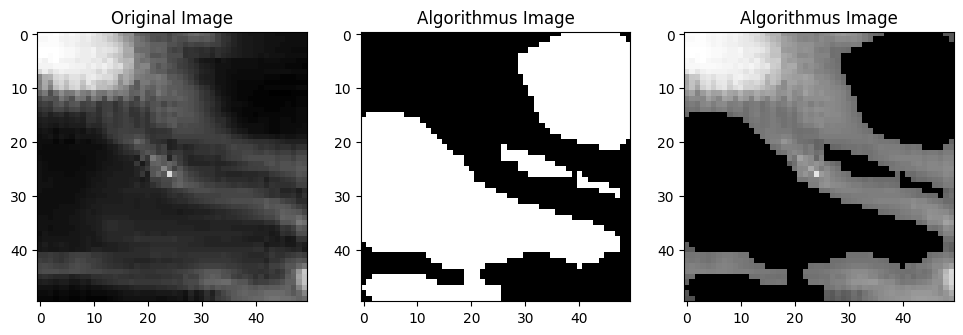

In [1033]:
test_image = np.copy(your_image[515:565,550:600])
test =cut_and_process_image(test_image, blk_size)

blk_size = 5
n_std = 1
pass_threshold = 1

background_image =  detect_background(test_image,test)
plt.figure(figsize=(16, 16))
plt.subplot(1, 4, 1), plt.imshow(test_image, cmap='gray'), plt.title('Original Image')

plt.subplot(1, 4, 2), plt.imshow(background_image, cmap='gray'), plt.title('Algorithmus Image')
background_image = background_image-255
background_off = cv2.bitwise_and(test_image, test_image, mask=background_image)

plt.subplot(1, 4, 3), plt.imshow(background_off, cmap='gray'), plt.title('Algorithmus Image')

masked_new_image =  np.copy(new_image[515:565,550:600])
for x in range(0, width):
    for y in range(0, length):
        if background_off[x][y]>0 :
            masked_new_image[x][y] = 0

#plt.subplot(1, 4, 4),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')

In [406]:
from tqdm import tqdm
import numpy as np

def cut_and_determind_background(image, big_blk_size, step, small_blk_size):
    # Step 1: Cut the 1024x1024 image into 6x6 pieces
    width, length = image.shape
    pieces = []
    locations = []

    for i in tqdm(range(0, width-big_blk_size+1, step), desc=f"Processing cutting into {big_blk_size}*{big_blk_size} pieces"):
        for j in range(0, length-big_blk_size+1, step):
             #print(i,j)
            piece = image[i:i + big_blk_size, j:j + big_blk_size]
            if len(piece[piece > 0]) > (big_blk_size**2/2-1):
                pieces.append(piece)
                locations.append([i, i + big_blk_size, j, j + big_blk_size])


    count_backgd = np.zeros((width, length), dtype='float64')
    count_image = np.zeros((width, length), dtype='float64')

    #print(len(pieces))
    for i in tqdm(range(len(pieces)), desc="Processing each piece and determind their background"):
        intial_back_ground = detect_background(pieces[i], cut_and_process_image(pieces[i], small_blk_size))
        for x in range(0, big_blk_size):
            for y in range(0, big_blk_size):
                if intial_back_ground[x, y] == 255:  # background
                    count_backgd[x + locations[i][0]][y + locations[i][2]] = count_backgd[x + locations[i][0]][y + locations[i][2]] + 1
                if intial_back_ground[x, y] == 0:  # not background
                    count_image[x + locations[i][0]][y + locations[i][2]] = count_image[x + locations[i][0]][y + locations[i][2]] + 1

    background_rate = np.zeros((width, length), dtype='float64')
    for x in range(0, width):
        for y in range(0, length):
            background_rate[x][y] = count_backgd[x][y]/( count_backgd[x][y]+ count_image[x][y])

    return background_rate


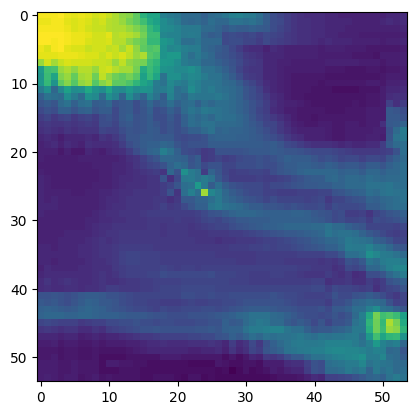

In [82]:
plt.imshow(test_image)

Processing cutting into 50*50 pieces: 100%|██████████| 975/975 [00:04<00:00, 224.43it/s]
Processing each piece and determind their background: 100%|██████████| 465395/465395 [5:08:05<00:00, 25.18it/s]  
C:\Users\Ding-Yang\AppData\Local\Temp\ipykernel_12676\63104857.py:36: RuntimeWarning: invalid value encountered in scalar divide
  background_rate[x][y] = count_backgd[x][y]/( count_backgd[x][y]+ count_image[x][y])


(<Axes: >, <matplotlib.image.AxesImage at 0x17f55db0d90>)

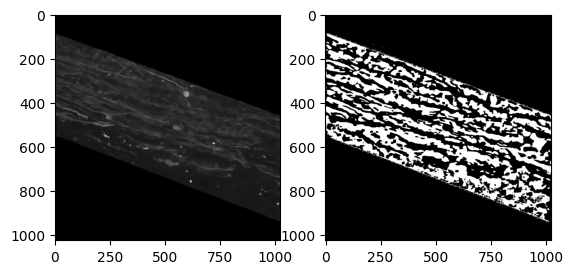

In [102]:
your_image = cv2.imread('Final3.jpg', cv2.IMREAD_COLOR) 
your_image = cv2.cvtColor(your_image, cv2.COLOR_BGR2GRAY)
#test_image = np.copy(your_image[515:569,550:604])

bg, bg_rate= cut_and_deetermind_background(your_image, 50 ,1,5)
#test2= detect_background(test_image, cut_and_process_image(test_image, 3))

plt.subplot(1, 2, 1), plt.imshow(your_image,cmap = "gray")
plt.subplot(1, 2, 2), plt.imshow(bg,cmap = "gray")

(<Axes: >, <matplotlib.image.AxesImage at 0x18029be3290>)

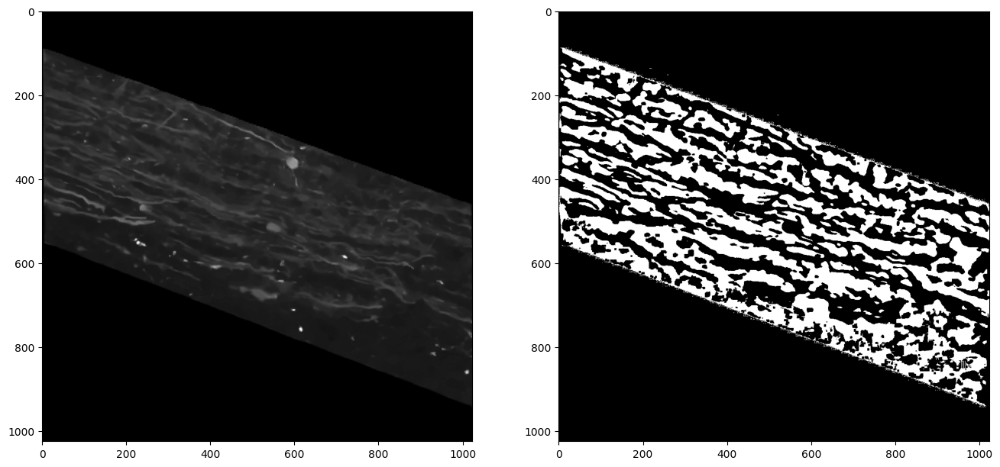

In [1034]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(your_image,cmap = "gray")
plt.subplot(1, 2, 2),plt.imshow(bg_rate>0.7,cmap = "gray")

(<Axes: >, <matplotlib.image.AxesImage at 0x1802a3a4b10>)

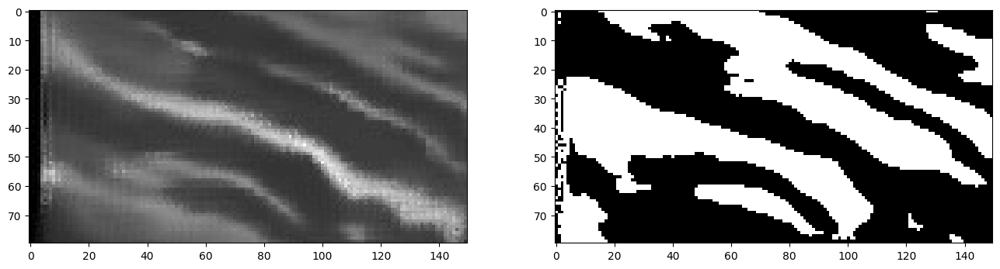

In [1036]:
plt.figure(figsize=(16, 16))
test = bg_rate>0.7
plt.subplot(1, 2, 1), plt.imshow(your_image[396:476,0:150],cmap = "gray")
plt.subplot(1, 2, 2), plt.imshow(test[396:476,0:150],cmap = "gray")

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

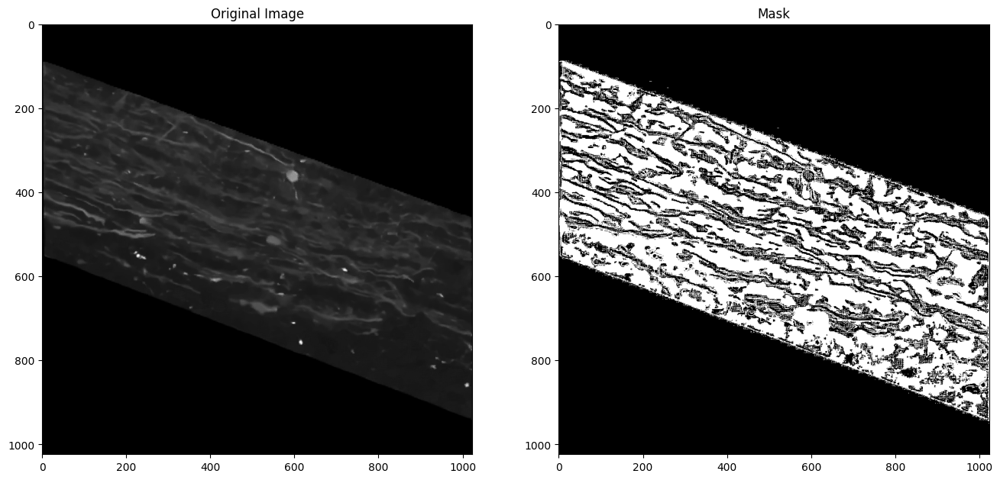

In [1041]:
width, length = your_image.shape
masked_your_image = np.copy(your_image)
masked_new_image =  np.copy(new_image)
for x in range(0, width):
    for y in range(0, length):
        if test[x][y] == True and your_image[x][y] != 0:
            masked_your_image[x][y] = 0
            masked_new_image[x][y] = 255

plt.figure(figsize=(16, 16))
            
plt.subplot(1, 2, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')

#plt.subplot(1, 2, 2), plt.imshow(masked_your_image, cmap='gray'), plt.title('Masked Image')
plt.subplot(1, 2, 2),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

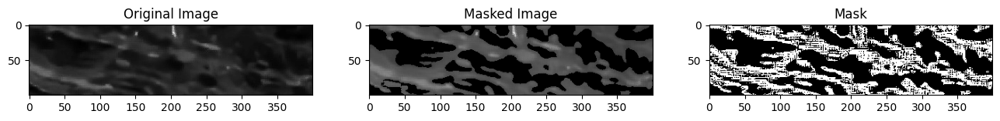

In [402]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image[400:500,400:800], cmap='gray'), plt.title('Original Image')

plt.subplot(1, 3, 2), plt.imshow(masked_your_image[400:500,400:800], cmap='gray'), plt.title('Masked Image')
plt.subplot(1, 3, 3),plt.imshow(masked_new_image[400:500,400:800]-255, cmap='gray'), plt.title('Mask')

In [ ]:
check, check_bg_rate= cut_and_deetermind_background(your_image[440:480,500:600], 30 ,1,5)

In [626]:
test

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]])

(<Axes: >, <matplotlib.image.AxesImage at 0x17fddeda990>)

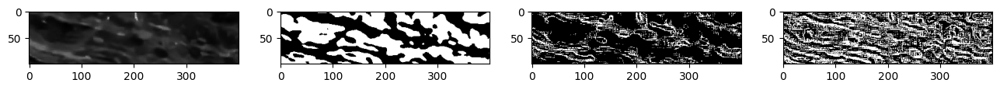

In [620]:
non_zero_pixel= bg_rate[400:500,400:800]
test = non_zero_pixel >= 0.59

width, length = non_zero_pixel.shape
#masked_your_image = np.copy(your_image[400:500,400:800])
masked_new_image =  np.copy(new_image[400:500,400:800])
for x in range(0, width):
    for y in range(0, length):
        if test[x][y] == True:
            #masked_your_image[x][y] = 0
            masked_new_image[x][y] = 0

plt.figure(figsize=(16, 16))

plt.subplot(1, 4, 1), plt.imshow(your_image[400:500,400:800],cmap = "gray")
plt.subplot(1, 4, 2), plt.imshow(test,cmap = "gray")
test = non_zero_pixel>0.7
plt.subplot(1, 4, 3), plt.imshow(masked_new_image,cmap = "gray")
plt.subplot(1, 4, 4), plt.imshow(new_image[400:500,400:800],cmap = "gray")

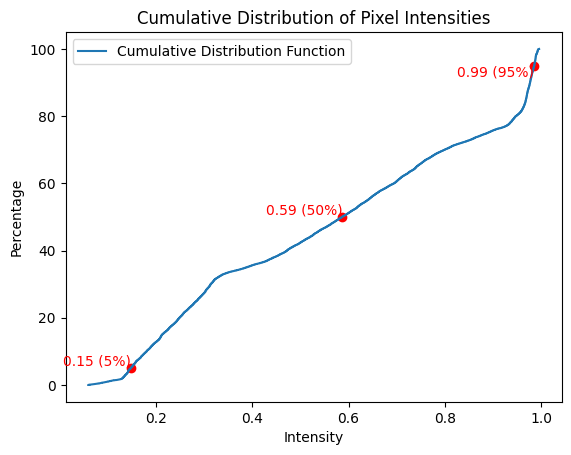

In [400]:
non_zero_pixels = bg_rate[400:500,400:500].flatten()
# Calculate the cumulative distribution function (CDF)
sorted_pixels = np.sort(non_zero_pixels)
cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100

# Plot the CDF
plt.plot(sorted_pixels, cumulative_percentage, label='Cumulative Distribution Function')

# Calculate intensity values for 5% and 95%
intensity_005 = np.percentile(sorted_pixels, 5)
intensity_05 = np.percentile(sorted_pixels, 50)
intensity_095 = np.percentile(sorted_pixels, 95)

# Label points on the plot
plt.scatter([intensity_005,intensity_05, intensity_095], [5,50, 95], color='red')
plt.text(intensity_005, 5, f'{intensity_005:.2f} (5%)', verticalalignment='bottom', horizontalalignment='right', color='red')
plt.text(intensity_05, 50, f'{intensity_05:.2f} (50%)', verticalalignment='bottom', horizontalalignment='right', color='red')

plt.text(intensity_095, 95, f'{intensity_095:.2f} (95%)', verticalalignment='top', horizontalalignment='right', color='red')

# Add labels and title
plt.xlabel('Intensity')
plt.ylabel('Percentage')
plt.title('Cumulative Distribution of Pixel Intensities')
plt.legend()

plt.show()

(<Axes: >, <matplotlib.image.AxesImage at 0x17fb8e66ad0>)

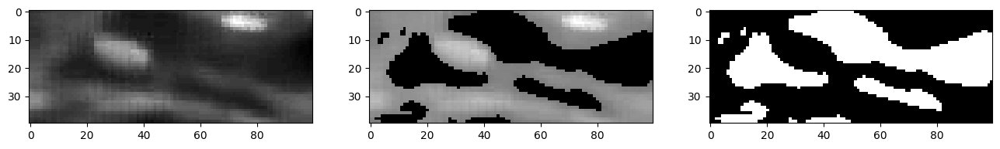

In [336]:
width, length = your_image[440:480,500:600].shape
masked_check = np.copy(your_image[440:480,500:600])
check =(check_bg_rate>=0.79)
for x in range(0, width):
    for y in range(0, length):
        if check[x][y] == True:
            masked_check[x][y] = 0

plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image[440:480,500:600],cmap = "gray")
plt.subplot(1, 3, 2), plt.imshow(masked_check,cmap = "gray")
plt.subplot(1, 3, 3), plt.imshow(check_bg_rate>=0.79,cmap = "gray")

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

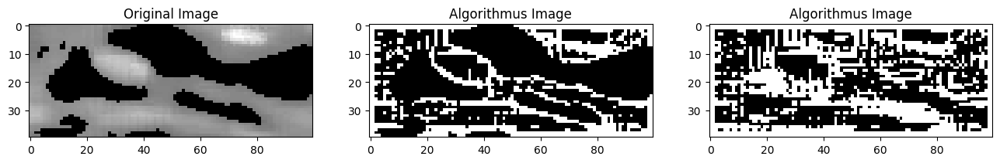

In [369]:

blk_size = 5
n_std = 1
pass_threshold = 1

new_masked_check =  determind_and_merge_grids(masked_check,cut_and_process_image(masked_check, blk_size), n_std, pass_threshold)
original =  determind_and_merge_grids(your_image[440:480,500:600],cut_and_process_image(your_image[440:480,500:600], blk_size), n_std, pass_threshold)

plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(masked_check, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow(new_masked_check, cmap='gray'), plt.title('Algorithmus Image')
plt.subplot(1, 3, 3), plt.imshow(original, cmap='gray'), plt.title('Algorithmus Image')

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

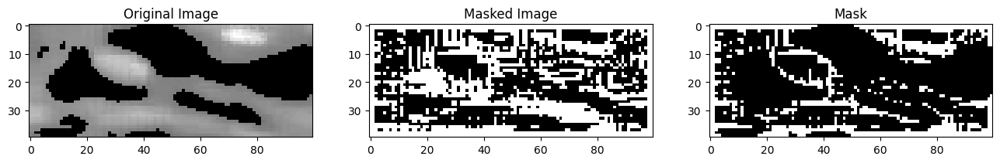

In [362]:
width, length = masked_check.shape
try1 = np.copy(masked_check)
for x in range(0, width):
    for y in range(0, length):
        if masked_check[x][y] > 0 and original[x][y] ==0:
            try1[x][y] = 0

for x in range(0, width):
    for y in range(0, length):
        if try1[x][y] > 0:
            try1[x][y] = 255
            
plt.figure(figsize=(16, 16))
            
plt.subplot(1, 3, 1), plt.imshow(masked_check, cmap='gray'), plt.title('Original Image')

plt.subplot(1, 3, 2), plt.imshow(original, cmap='gray'), plt.title('Masked Image')
plt.subplot(1, 3, 3),plt.imshow(try1, cmap='gray'), plt.title('Mask')

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

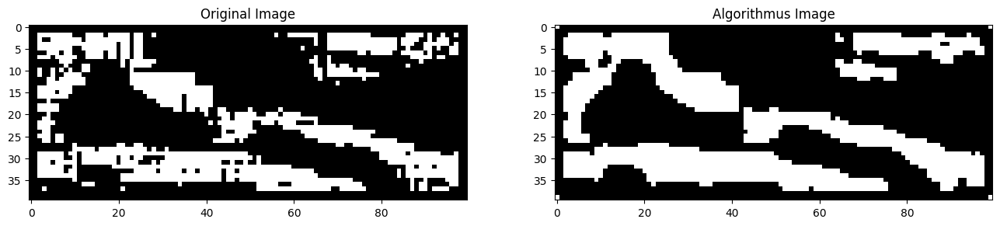

In [352]:
try1
try1test_image = cut_and_process_image(try1, 3)
#count = 0
for i in range(0,len(try1test_image)):
    if sum(sum(np.float64(try1test_image[i]))) >= 4*255:
        try1test_image[i] = np.where(try1test_image[i] == 0, 255, try1test_image[i])
    else:
        #print(count, i[2,2])
        try1test_image[i] = np.where(try1test_image[i] ==  255,0, try1test_image[i])
  #  count = count+1
reconstructed_try1image = merge_pieces(try1test_image, try1.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(try1, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_try1image, cmap='gray'), plt.title('Algorithmus Image')


# choose the background rate for each grid 
doesn't work like I thought

In [518]:
from tqdm import tqdm
import numpy as np

def choose_the_background_rate(image, big_blk_size, precentage):
    # Step 1: Cut the 1024x1024 image into 6x6 pieces
    width, length = image.shape
    pieces = []
    locations = []
    new_image = np.zeros((width, length), dtype='bool')
    for i in range(0, width-big_blk_size+1, big_blk_size):
        for j in tqdm(range(0, length-big_blk_size+1, big_blk_size), desc=f"Processing cutting into {big_blk_size}*{big_blk_size} pieces"):
            #print(i,j)
            piece = image[i:i + big_blk_size, j:j + big_blk_size]
            if len(piece[piece > 0]) > (big_blk_size**2/2-1):
                locations.append([i, i + big_blk_size, j, j + big_blk_size])
                non_zero_pixels = piece.flatten()
    # Calculate the cumulative distribution function (CDF)
                sorted_pixels = np.sort(non_zero_pixels)
                cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100
                intensity_05 = np.percentile(sorted_pixels, precentage)
                #print(intensity_05,[i, i + big_blk_size, j, j + big_blk_size])
                new_image[i: i + big_blk_size, j: j + big_blk_size] = piece >=intensity_05
            
    if locations[-1][1] < width or locations[-1][3] < length:
        rest_width = width - locations[-1][1]
        rest_length = length - locations[-1][3]
        if rest_length != 0:
            non_zero_pixels = image[0:width, locations[-1][3]: length].flatten()
            sorted_pixels = np.sort(non_zero_pixels)
            cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100
            intensity_05 = np.percentile(sorted_pixels, precentage)
            new_image[0:width, locations[-1][3]: length] =image[0:width, locations[-1][3]: length] >=intensity_05
            #print(intensity_05)
        if rest_width != 0:
            non_zero_pixels = image[locations[-1][1]:width, 0: length].flatten()
            sorted_pixels = np.sort(non_zero_pixels)
            cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100
            intensity_05 = np.percentile(sorted_pixels, precentage)
            new_image[locations[-1][1]:width, 0: length] =image[locations[-1][1]:width, 0: length] >=intensity_05
            #print(intensity_05)
    return new_image
                
                


Processing cutting into 50*50 pieces: 100%|██████████| 7/7 [00:00<00:00, 6990.51it/s]


array([[0.1404    , 0.1484    , 0.1584    , ..., 0.53352067, 0.29340836,
        0.12957746],
       [0.1416    , 0.1496    , 0.1592    , ..., 0.53464157, 0.301002  ,
        0.13237064],
       [0.1432    , 0.1508    , 0.16      , ..., 0.5084    , 0.29971989,
        0.13610889],
       ...,
       [0.9464    , 0.944     , 0.9432    , ..., 0.9744    , 0.9764    ,
        0.9736    ],
       [0.9476    , 0.9336    , 0.93      , ..., 0.974     , 0.976     ,
        0.9728    ],
       [0.9492    , 0.9312    , 0.9112    , ..., 0.9744    , 0.9764    ,
        0.9732    ]])

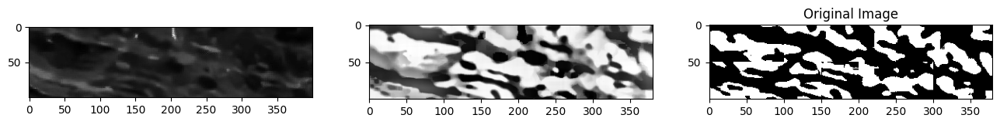

In [536]:
test = bg_rate[400:500,400:780] >= 0.59
plt.figure(figsize=(16, 16))

plt.subplot(1, 3, 1), plt.imshow(your_image[400:500,400:800],cmap = "gray")
plt.subplot(1, 3, 2), plt.imshow( bg_rate[400:500,400:780],cmap = "gray")
plt.subplot(1, 3, 3),plt.imshow(choose_the_background_rate(bg_rate[400:500,400:780],50,59), cmap='gray'), plt.title('Original Image')
bg_rate[400:500,400:780]

(<matplotlib.image.AxesImage at 0x17ff4329250>,
 Text(0.5, 1.0, 'Original Image'))

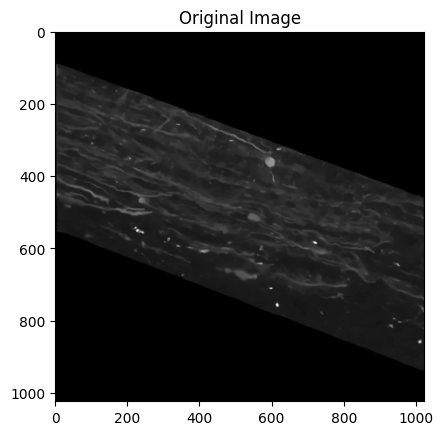

In [721]:
 plt.imshow(your_image, cmap='gray'), plt.title('Original Image')


Processing cutting into 100*100 pieces: 100%|██████████| 10/10 [00:00<00:00, 9998.34it/s]


(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

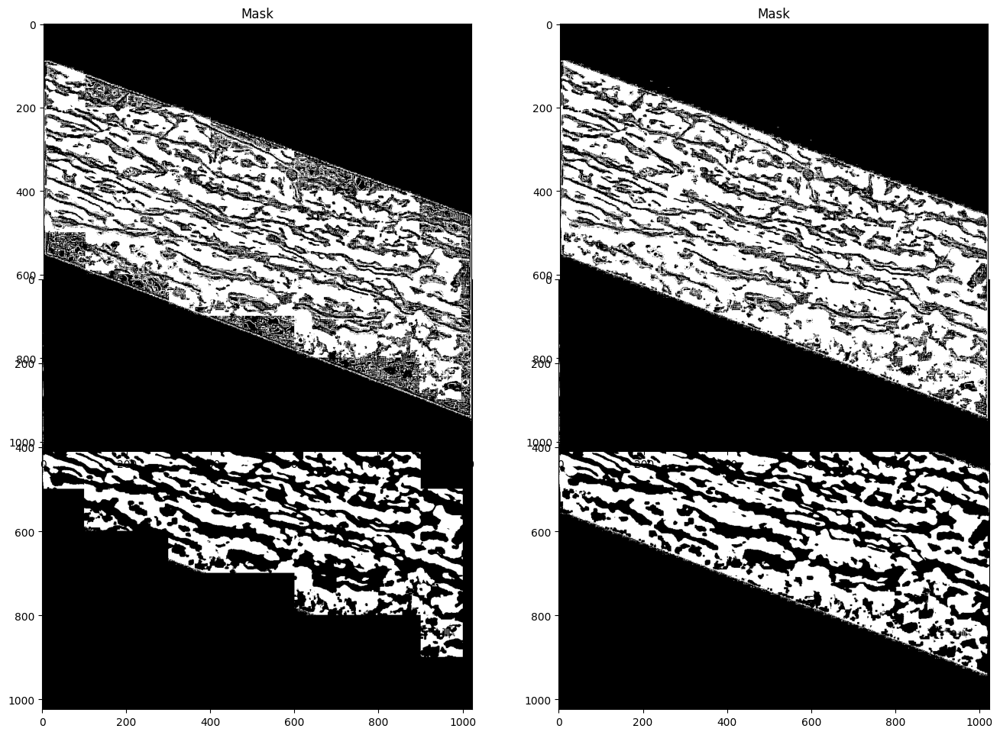

In [722]:
test = choose_the_background_rate(bg_rate,100,50)
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(test, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow( bg_rate >= 0.59, cmap='gray'), plt.title('Original Image')
masked_new_image =  np.copy(new_image)
width, length = new_image.shape
for x in range(0, width):
    for y in range(0, length):
        if test[x][y]==1:
            masked_new_image[x][y] = 255
        #if background_off[x][y]==0:
plt.subplot(2, 2, 1),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')
masked_new_image =  np.copy(new_image)
width, length = new_image.shape
for x in range(0, width):
    for y in range(0, length):
        if bg_rate[x][y]>=0.59:
            masked_new_image[x][y] = 255
        #if background_off[x][y]==0:
plt.subplot(2, 2, 2),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')


Processing cutting into 40*40 pieces: 100%|██████████| 2/2 [00:00<00:00, 1998.24it/s]


(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

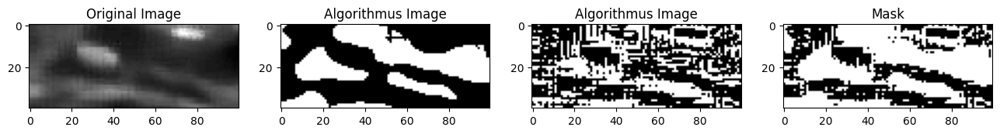

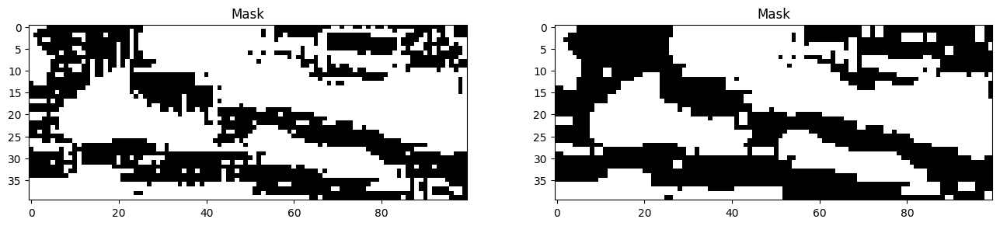

In [713]:
test_image = np.copy(your_image[440:480,500:600])
test = choose_the_background_rate(bg_rate[440:480,500:600],40,60)


plt.figure(figsize=(16, 16))
plt.subplot(1, 4, 1), plt.imshow(test_image, cmap='gray'), plt.title('Original Image')
#background_off = cv2.bitwise_and(test_image, test_image, mask=background_image)

plt.subplot(1, 4, 2), plt.imshow(test, cmap='gray'), plt.title('Algorithmus Image')
plt.subplot(1, 4, 3), plt.imshow(new_image[440:480,500:600], cmap='gray'), plt.title('Algorithmus Image')


masked_new_image =  np.copy(new_image[440:480,500:600])
width, length = test_image.shape
for x in range(0, width):
    for y in range(0, length):
        if test[x][y]==1 :
            masked_new_image[x][y] = 255
        #if background_off[x][y]==0:
plt.subplot(1, 4, 4),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')

import cv2
import numpy as np

kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(masked_new_image, cv2.MORPH_OPEN, kernel)
#opening = cv2.morphologyEx(opening, cv2.MORPH_OPEN, kernel)

#kernel = np.ones((4,4),np.uint8)
#closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
#opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(16, 16))

plt.subplot(2, 2, 1),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')
plt.subplot(2, 2, 2),plt.imshow(opening, cmap='gray'), plt.title('Mask')


In [703]:
ttt = np.copy(bg_rate)
ttt = np.nan_to_num(ttt, nan=0)


(<Axes: >, <matplotlib.image.AxesImage at 0x17fcbfab490>)

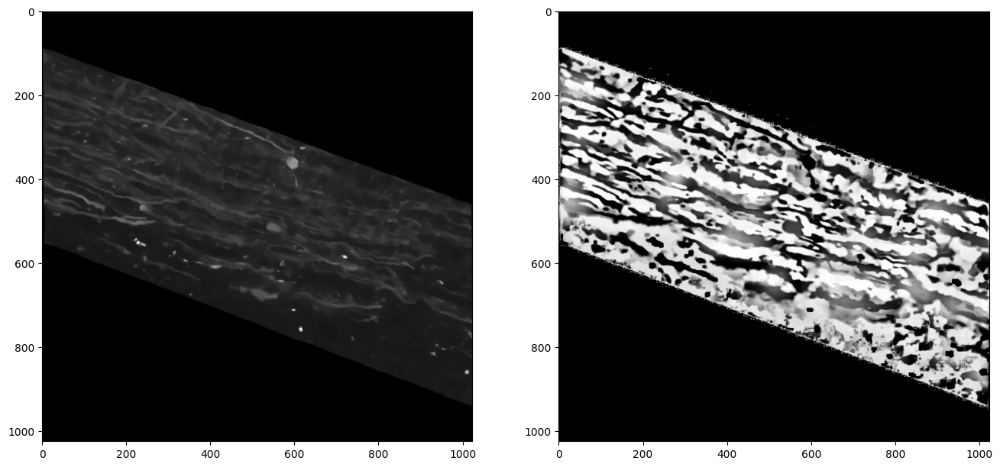

In [551]:
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(your_image,cmap = "gray")
plt.subplot(1, 2, 2), plt.imshow(ttt,cmap = "gray")


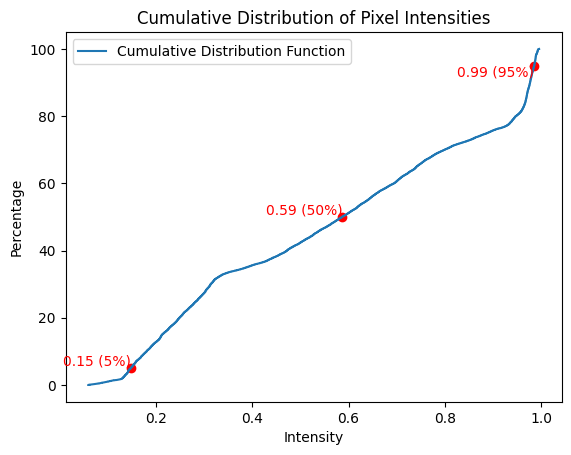

In [537]:
non_zero_pixels = bg_rate[400:500,400:500].flatten()
# Calculate the cumulative distribution function (CDF)
sorted_pixels = np.sort(non_zero_pixels)
cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100

# Plot the CDF
plt.plot(sorted_pixels, cumulative_percentage, label='Cumulative Distribution Function')

# Calculate intensity values for 5% and 95%
intensity_005 = np.percentile(sorted_pixels, 5)
intensity_05 = np.percentile(sorted_pixels, 50)
intensity_095 = np.percentile(sorted_pixels, 95)

# Label points on the plot
plt.scatter([intensity_005,intensity_05, intensity_095], [5,50, 95], color='red')
plt.text(intensity_005, 5, f'{intensity_005:.2f} (5%)', verticalalignment='bottom', horizontalalignment='right', color='red')
plt.text(intensity_05, 50, f'{intensity_05:.2f} (50%)', verticalalignment='bottom', horizontalalignment='right', color='red')

plt.text(intensity_095, 95, f'{intensity_095:.2f} (95%)', verticalalignment='top', horizontalalignment='right', color='red')

# Add labels and title
plt.xlabel('Intensity')
plt.ylabel('Percentage')
plt.title('Cumulative Distribution of Pixel Intensities')
plt.legend()

plt.show()

# remove some isolated dots and improve the mean sticks

In [ ]:
def merge_pieces(pieces, original_shape, blk_size):
    width, length = original_shape
    merged_image = np.zeros((width, length), dtype='uint8')
    distance = int(blk_size/2)
    index = 0
    for i in range(0, width):
        for j in range(0, length):
            merged_image[i, j] = pieces[index][distance, distance]
            index += 1
    return merged_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

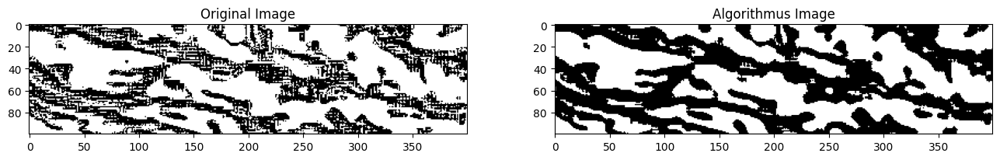

In [168]:
rsid = cut_and_process_image(masked_new_image, 5)
#count = 0
for i in range(0,len(rsid)):
    if sum(sum(np.float64(rsid[i]))) >= 16*255:
        rsid[i] = np.where(rsid[i] == 0, 255, rsid[i])
    else:
        #print(count, i[2,2])
        rsid[i] = np.where(rsid[i] ==  255,0, rsid[i])
  #  count = count+1
reconstructed_image = merge_pieces(rsid, masked_new_image.shape, 5)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(masked_new_image[400:500,400:800], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image[400:500,400:800], cmap='gray'), plt.title('Algorithmus Image')


(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

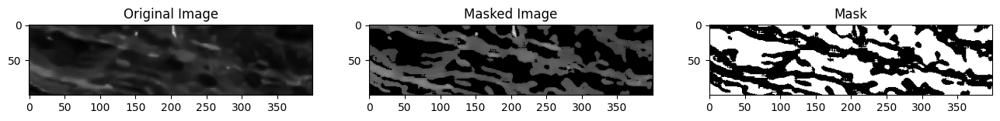

In [1046]:
width, length = your_image.shape
masked_your_image = np.copy(your_image)
for x in range(0, width):
    for y in range(0, length):
        if reconstructed_image[x][y] == 255 and your_image[x][y] != 0:
            masked_your_image[x][y] = 0

plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image[400:500,400:800], cmap='gray'), plt.title('Original Image')

plt.subplot(1, 3, 2), plt.imshow(masked_your_image[400:500,400:800], cmap='gray'), plt.title('Masked Image')
plt.subplot(1, 3, 3),plt.imshow(reconstructed_image[400:500,400:800], cmap='gray'), plt.title('Mask')

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

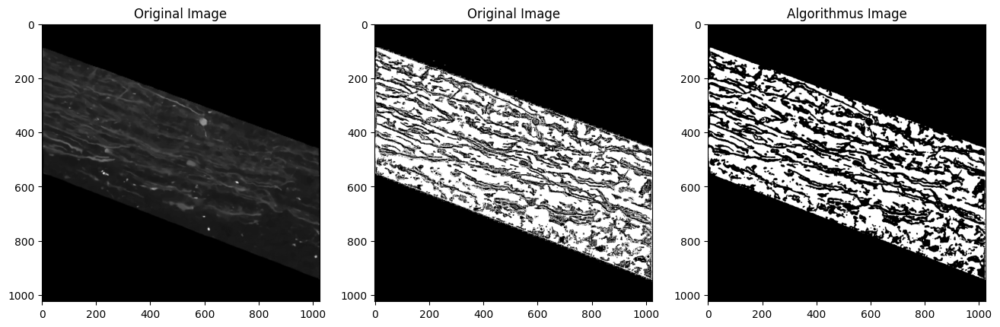

In [169]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')

plt.subplot(1, 3, 2), plt.imshow(masked_new_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1,3,3), plt.imshow(reconstructed_image, cmap='gray'), plt.title('Algorithmus Image')


(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

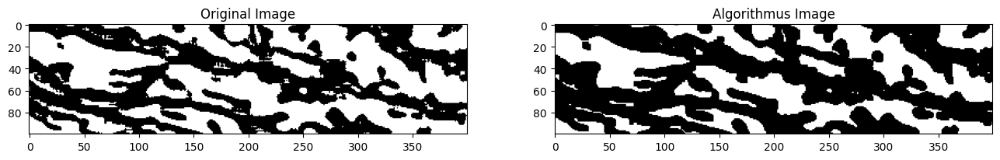

In [172]:
rsid = cut_and_process_image(reconstructed_image, 3)
#count = 0
for i in range(0,len(rsid)):
    if sum(sum(np.float64(rsid[i]))) >= 9*255:
        rsid[i] = np.where(rsid[i] == 0, 255, rsid[i])
    else:
        #print(count, i[2,2])
        rsid[i] = np.where(rsid[i] ==  255,0, rsid[i])
  #  count = count+1
reconstructed_image_2 = merge_pieces(rsid, reconstructed_image.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(reconstructed_image[400:500,400:800], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image_2[400:500,400:800], cmap='gray'), plt.title('Algorithmus Image')


(<Axes: >, <matplotlib.image.AxesImage at 0x17fe341cb10>)

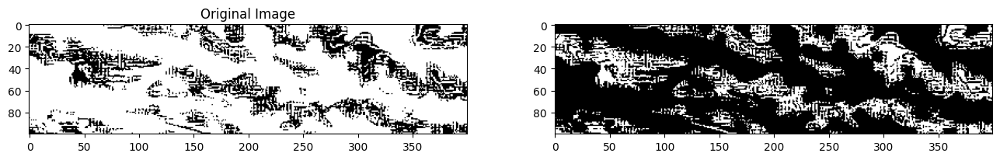

In [748]:
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(masked_new_image[400:500,400:800], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(masked_new_image[400:500,400:800]-1,cmap = 'gray')

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

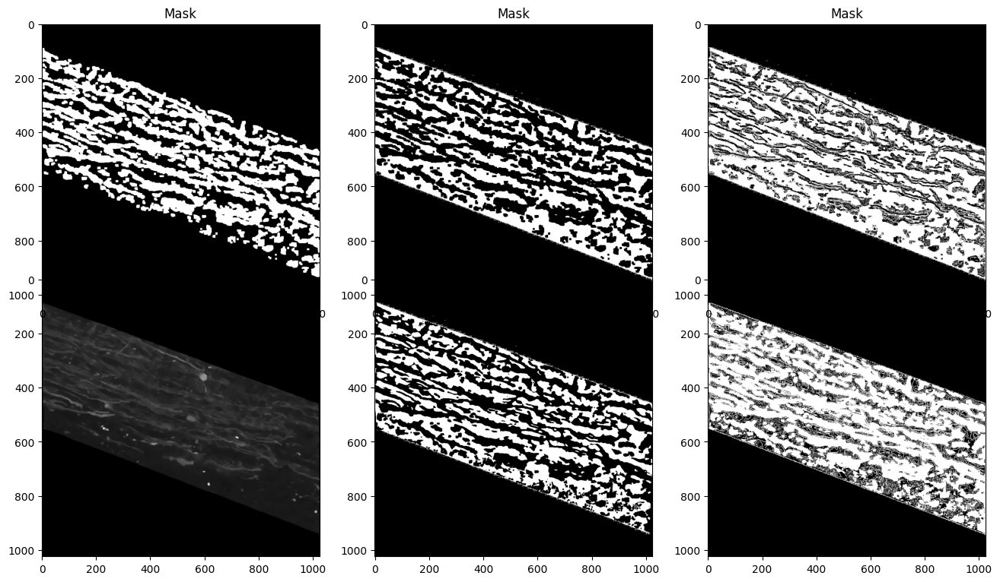

In [745]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(your_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow( bg_rate >= 0.7, cmap='gray'), plt.title('Original Image')
masked_new_image =  np.copy(new_image)

non_zero_pixels = your_image[your_image > 0]
# Calculate the cumulative distribution function (CDF)
sorted_pixels = np.sort(non_zero_pixels)
cumulative_percentage = np.arange(1, len(sorted_pixels) + 1) / len(sorted_pixels) * 100

# Calculate intensity values for 5% and 95%
intensity_01 = np.percentile(sorted_pixels, 10)

width, length = new_image.shape
for x in range(0, width):
    for y in range(0, length):
        if bg_rate[x][y]<=0.7 and your_image[x][y]>=intensity_01:
            masked_new_image[x][y] = 255
        #if background_off[x][y]==0:
plt.subplot(1, 3, 3),plt.imshow(masked_new_image, cmap='gray'), plt.title('Mask')



kernel = np.ones((7,7),np.uint8)
opening = cv2.morphologyEx(masked_new_image, cv2.MORPH_OPEN, kernel)
#opening = cv2.morphologyEx(opening, cv2.MORPH_OPEN, kernel)
plt.subplot(2, 3, 1),plt.imshow(opening, cmap='gray'), plt.title('Mask')


width, length = new_image.shape
for x in range(0, width):
    for y in range(0, length):
        if your_image[x][y]>0 and opening[x][y]==0:
            opening[x][y] =  255
        elif your_image[x][y]>0 and opening[x][y]>0:
            opening[x][y] =  0

plt.subplot(2, 3, 2),plt.imshow(opening, cmap='gray'), plt.title('Mask')
final_image = np.copy(new_image)
width, length = new_image.shape
for x in range(0, width):
    for y in range(0, length):
        if opening[x][y]>0:
            final_image[x][y] =  255
        
plt.subplot(2, 3, 3),plt.imshow(final_image, cmap='gray'), plt.title('Mask')
#kernel = np.ones((4,4),np.uint8)
#closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

(<Axes: >, <matplotlib.image.AxesImage at 0x1800a4a9810>)

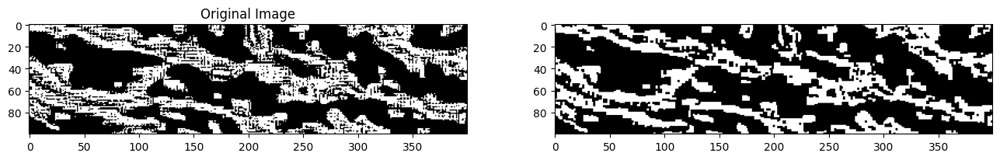

In [779]:
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(final_image[400:500,400:800]-1, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(opening[400:500,400:800]-1, cmap = 'gray')

In [754]:
final_image[400:500,400:800]

array([[  0, 255,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

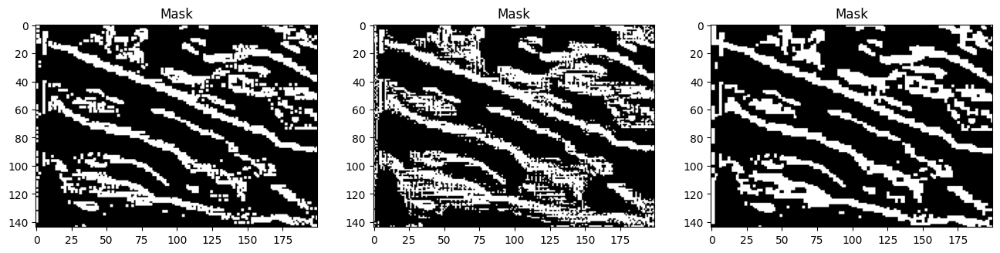

In [1039]:

kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
closing = final_image-255
closing = cv2.morphologyEx(final_image, cv2.MORPH_CLOSE, kernel)
plt.figure(figsize=(16, 16))
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)

plt.subplot(1,3, 1),plt.imshow(closing[356:500,0:200]-1, cmap='gray'), plt.title('Mask')
plt.subplot(1, 3, 2),plt.imshow(final_image[356:500,0:200]-1, cmap='gray'), plt.title('Mask')
plt.subplot(1,3, 3),plt.imshow(opening[356:500,0:200]-1, cmap='gray'), plt.title('Mask')


In [939]:
def enhance_intensity(image, mask):
    new_image = np.copy(image)
    width, length = image.shape
    for i in range(width):
        for j in range(length):
            if mask[i][j] >0:
                new_image[i][j]=((new_image[i][j]/255)**2)*255
            else:
                new_image[i][j]=0
    return new_image

In [940]:
your_image[356:500,0:200]

array([[ 0,  0,  0, ..., 60, 61, 73],
       [ 0,  0,  1, ..., 53, 56, 54],
       [ 1,  0,  1, ..., 56, 48, 49],
       ...,
       [ 0,  0,  6, ..., 79, 85, 67],
       [ 1,  2,  8, ..., 89, 85, 83],
       [ 0,  1,  6, ..., 90, 96, 81]], dtype=uint8)

In [941]:
enhance_intensity(your_image[356:500,0:200],bg_rate[356:500,0:200]<=0.7)

array([[ 0,  0,  0, ..., 14, 14, 20],
       [ 0,  0,  0, ..., 11, 12, 11],
       [ 0,  0,  0, ..., 12,  9,  9],
       ...,
       [ 0,  0,  0, ..., 24, 28, 17],
       [ 0,  0,  0, ..., 31, 28, 27],
       [ 0,  0,  0, ..., 31, 36, 25]], dtype=uint8)

(<Axes: title={'center': 'Mask'}>,
 Text(0.5, 1.0, 'Mask'))

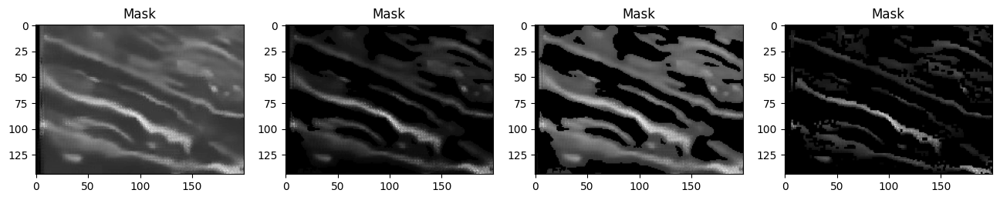

In [942]:
plt.figure(figsize=(16, 16))
plt.subplot(1,4, 1),plt.imshow(your_image[356:500,0:200], cmap='gray'), plt.title('Mask')

plt.subplot(1,4,2),plt.imshow(enhance_intensity(your_image[356:500,0:200],bg_rate[356:500,0:200]<=0.7), cmap='gray'), plt.title('Mask')
plt.subplot(1, 4, 3),plt.imshow(masked_your_image[356:500,0:200], cmap='gray'), plt.title('Mask')
plt.subplot(1,4, 4),plt.imshow(enhance_intensity(your_image[356:500,0:200],opening[356:500,0:200]-255), cmap='gray'), plt.title('Mask')


# try erosion

(<matplotlib.image.AxesImage at 0x1462bbb3890>, Text(0.5, 1.0, 'Masked Image'))

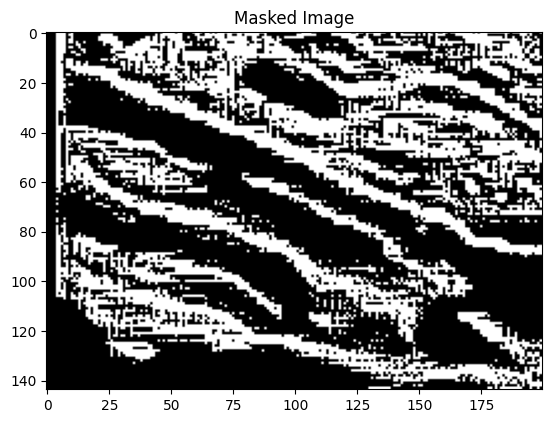

In [641]:
binary_image = 255 - test2
plt.imshow(binary_image[356:500,0:200], cmap='gray'), plt.title('Masked Image')

In [965]:
from skimage.morphology import erosion, dilation

def multi_erosion(image, kernel, iterations):
    for i in range(iterations):
        
        image = erosion(image, kernel)
    return image

(<Axes: title={'center': 'Original Image'}>,
 Text(0.5, 1.0, 'Original Image'))

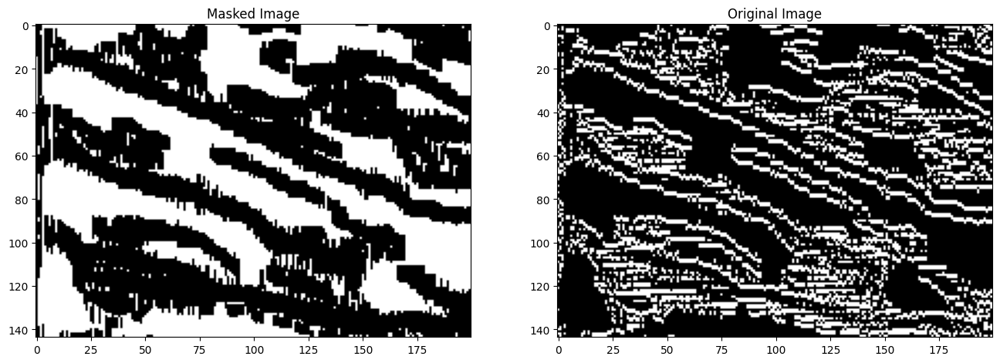

In [971]:
long_v_line = np.array([[0,1,0],
                        [0,1,0],
                        [0,1,0]])
step_1 = multi_erosion(final_image, long_v_line, 2)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(step_1[356:500,0:200], cmap='gray'), plt.title('Masked Image')
test3 = np.copy(final_image)
width, length = final_image.shape
for i in range(0, width):
        for j in range(0, length):
            if step_1[i,j] == 255:
                test3[i, j] =0
plt.subplot(1, 2, 2), plt.imshow(test3[356:500,0:200], cmap='gray'), plt.title('Original Image')

(<Axes: >, <matplotlib.image.AxesImage at 0x1802220d4d0>)

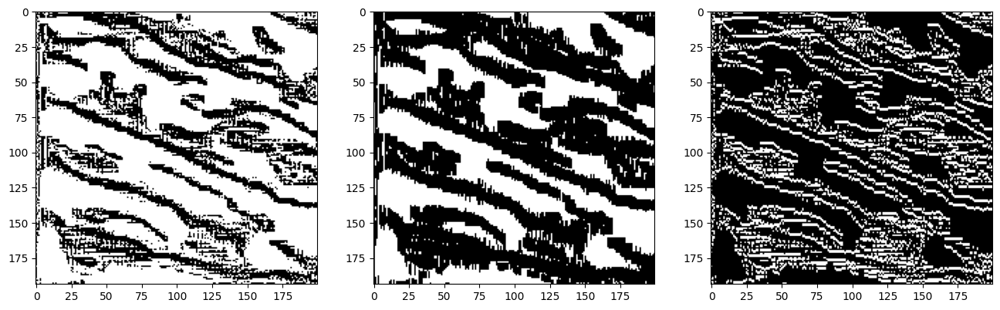

In [972]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 3, 1), plt.imshow(final_image[306:500,0:200], cmap='gray')
plt.subplot(1, 3, 2), plt.imshow(step_1[306:500,0:200], cmap = 'gray')
plt.subplot(1, 3, 3), plt.imshow(test3[306:500,0:200], cmap = 'gray')

(<Axes: title={'center': 'Masked Image'}>,
 Text(0.5, 1.0, 'Masked Image'))

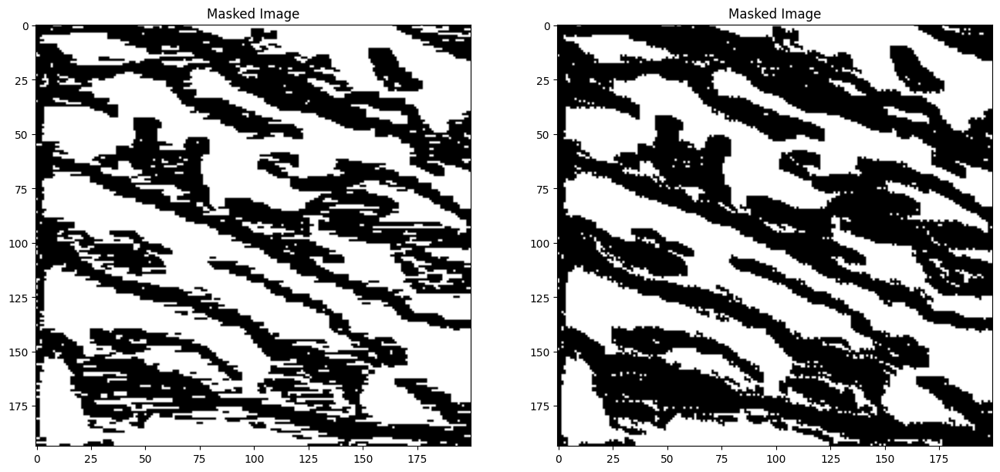

In [974]:
plt.figure(figsize=(16, 16))
long_h_line = np.array([[0,0,0],
                        [1,1,1],
                        [0,0,0]])
step_2 = multi_erosion(final_image, long_h_line, 1)

plt.subplot(1, 2, 1), plt.imshow(step_2[306:500,0:200], cmap='gray'), plt.title('Masked Image')
long_slope_line = np.array([[1,0,0],
                        [1,1,1],
                        [0,0,1]])
step_3 = multi_erosion(final_image, long_slope_line, 1)
plt.subplot(1, 2, 2), plt.imshow(step_3[306:500,0:200], cmap='gray'), plt.title('Masked Image')


In [983]:
width, length = binary_image.shape

final = np.zeros((width, length), dtype='uint8')
for i in range(0, width):
        for j in range(0, length):
            if step_1[i,j] == 255 or step_2[i,j] == 255 or step_3[i,j] == 255 :
                final[i, j] =255
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(binary_image[400:500,400:800], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(final[400:500,400:800], cmap='gray'), plt.title('final Image')

NameError: name 'binary_image' is not defined

(<Axes: title={'center': 'final Image'}>,
 Text(0.5, 1.0, 'final Image'))

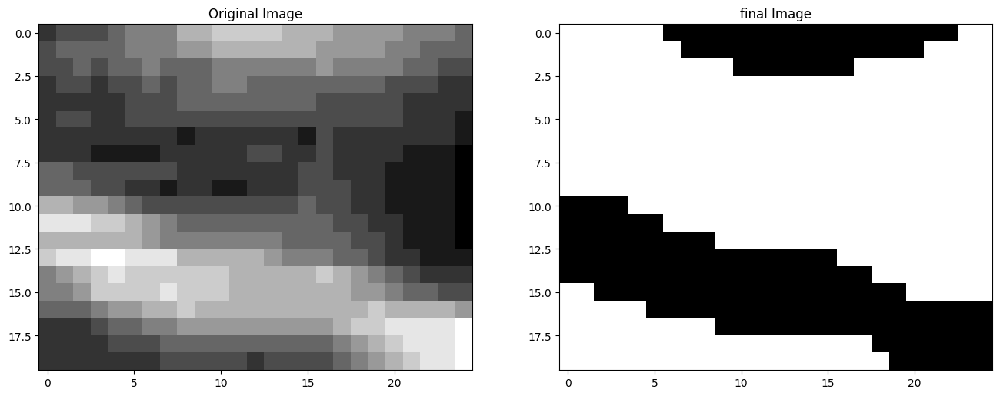

In [980]:

plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(your_image[450:470,560:585], cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(bg[450:470,560:585], cmap='gray'), plt.title('final Image')

# Try denosied

In [156]:
def merge_pieces(pieces, original_shape, blk_size):
    width, length = original_shape
    merged_image = np.zeros((width, length), dtype='uint8')
    distance = int(blk_size/2)
    index = 0
    for i in range(0, width):
        for j in range(0, length):
            merged_image[i, j] = pieces[index][distance, distance]
            index += 1
    return merged_image

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

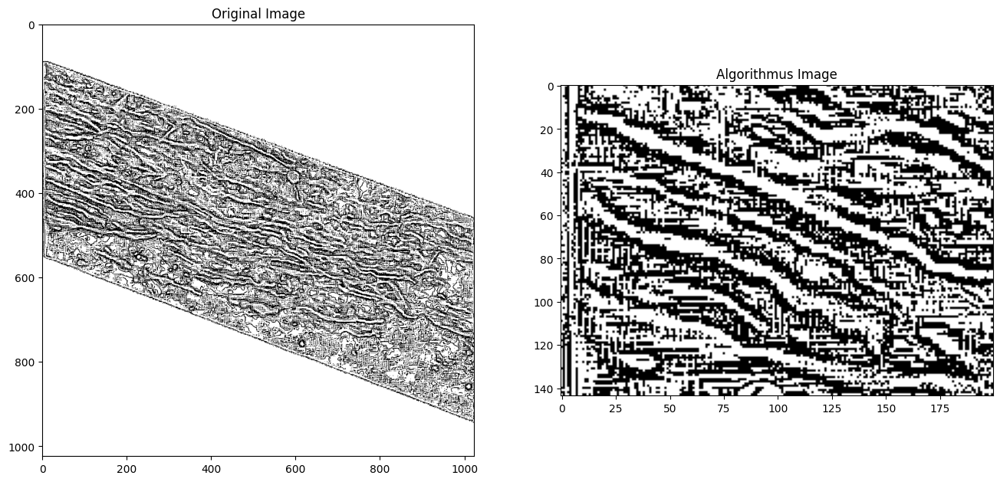

In [597]:
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1), plt.imshow(binary_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(binary_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')


(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

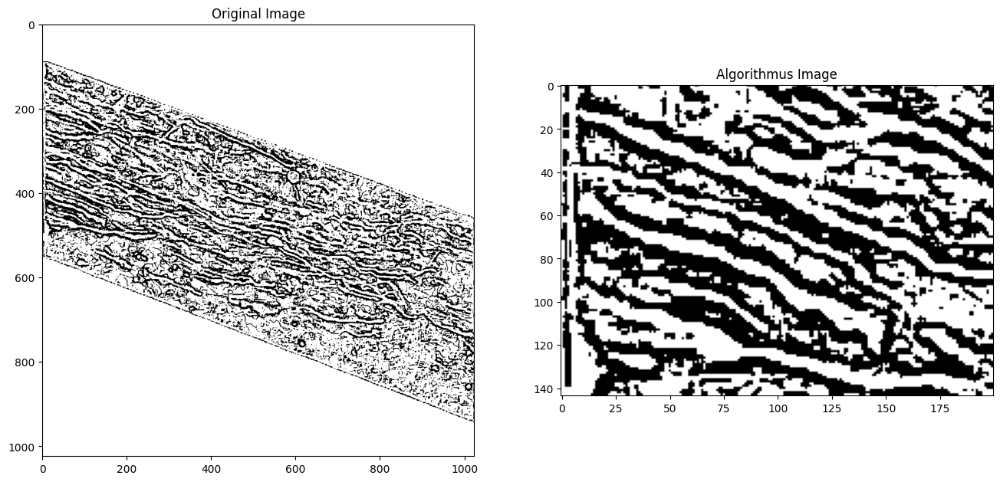

In [620]:
test_image = cut_and_process_image(binary_image, 3)
#count = 0
for i in range(0,len(test_image)):
    if sum(sum(np.float64(test_image[i]))) >= 5*255:
        test_image[i] = np.where(test_image[i] == 0, 255, test_image[i])
    else:
        #print(count, i[2,2])
        test_image[i] = np.where(test_image[i] ==  255,0, test_image[i])
  #  count = count+1
reconstructed_image = merge_pieces(test_image, new_image.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(reconstructed_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')


(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

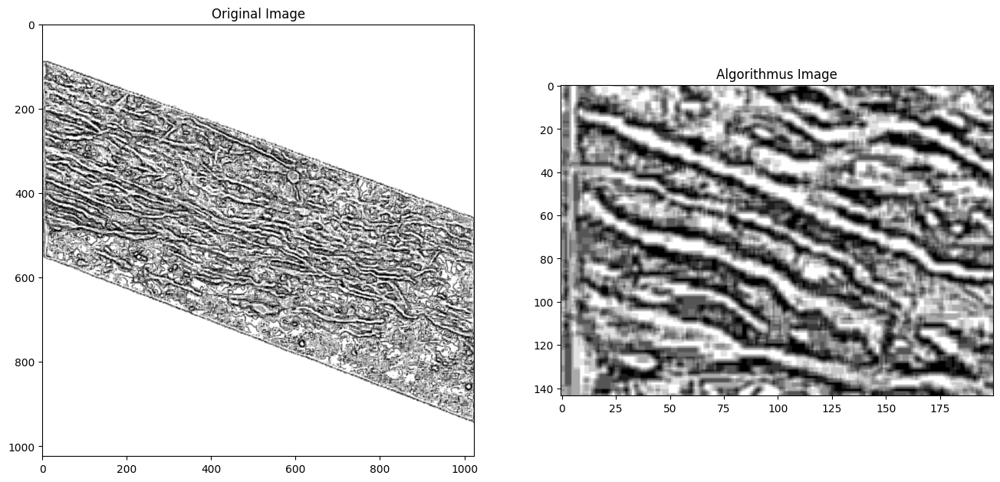

In [621]:
test_image = cut_and_process_image(binary_image, 3)
#count = 0
for i in range(0,len(test_image)):
    mean = np.mean(test_image[i])
    test_image[i] = np.full_like(test_image[i], mean)


reconstructed_image = merge_pieces(test_image, new_image.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(reconstructed_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

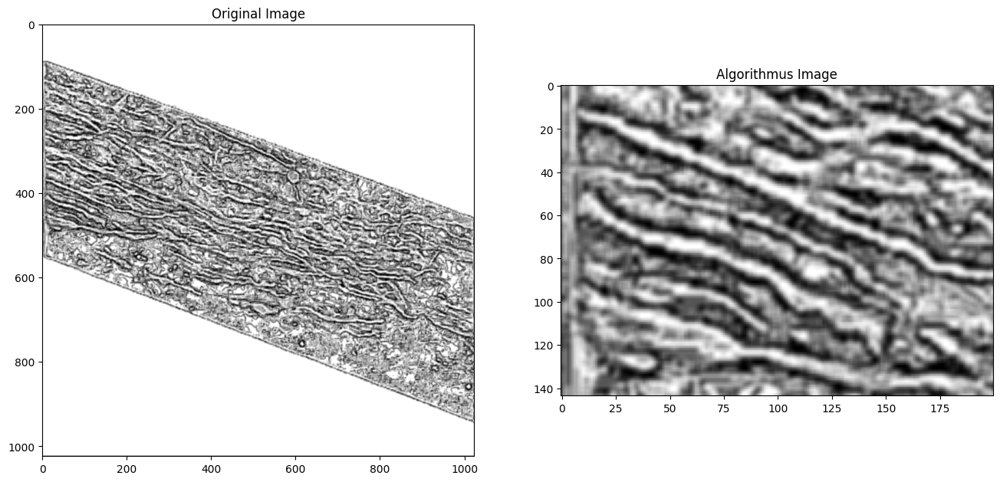

In [603]:
test_image = cut_and_process_image(reconstructed_image, 3)
#count = 0
for i in range(0,len(test_image)):
    mean = np.mean(test_image[i])
    test_image[i] = np.full_like(test_image[i], mean)


reconstructed_image = merge_pieces(test_image, reconstructed_image.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(reconstructed_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')

In [605]:
cv2.imwrite("algo_try1.jpg", reconstructed_image)

True

(<Axes: title={'center': 'Algorithmus Image'}>,
 Text(0.5, 1.0, 'Algorithmus Image'))

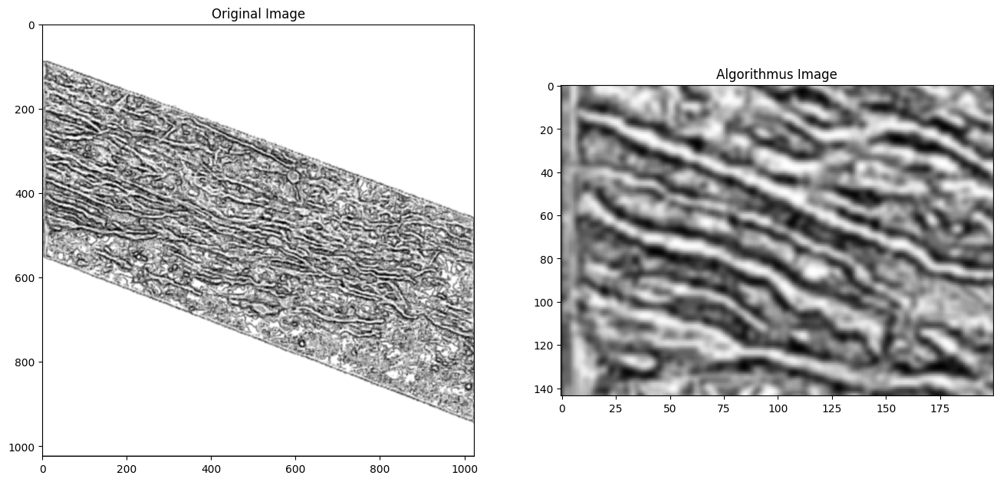

In [604]:
test_image = cut_and_process_image(reconstructed_image, 3)
#count = 0
for i in range(0,len(test_image)):
    mean = np.mean(test_image[i])
    test_image[i] = np.full_like(test_image[i], mean)


reconstructed_image = merge_pieces(test_image, reconstructed_image.shape, 3)
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(reconstructed_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(reconstructed_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')

True

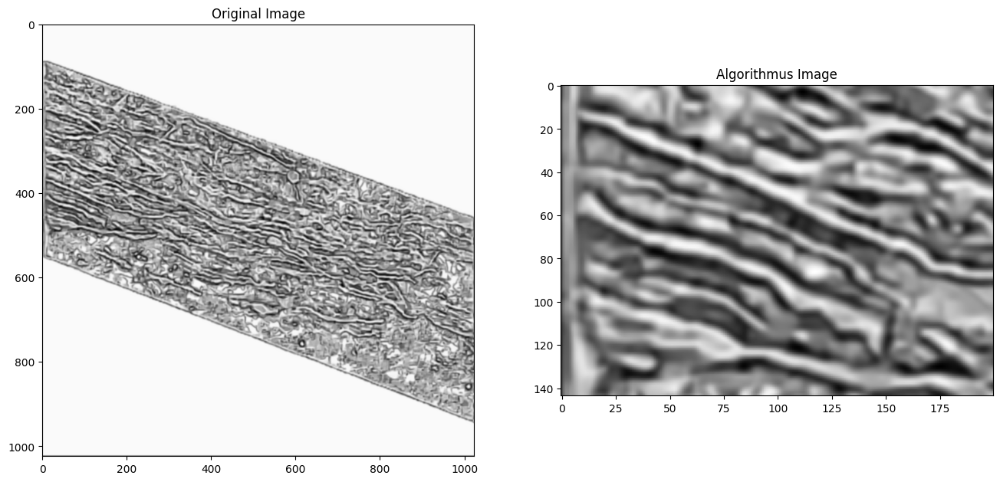

In [609]:
plt.figure(figsize=(16, 16))

plt.subplot(1, 2, 1), plt.imshow(denoised_image, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 2, 2), plt.imshow(denoised_image[356:500,0:200], cmap='gray'), plt.title('Algorithmus Image')
cv2.imwrite("algo_try1_denoised.jpg", denoised_image)

Bin 1: Range 58.00 to 77.70, Count: 4.0
Bin 2: Range 77.70 to 97.40, Count: 84.0
Bin 3: Range 97.40 to 117.10, Count: 894.0
Bin 4: Range 117.10 to 136.80, Count: 3110.0
Bin 5: Range 136.80 to 156.50, Count: 0.0
Bin 6: Range 156.50 to 176.20, Count: 263.0
Bin 7: Range 176.20 to 195.90, Count: 7185.0
Bin 8: Range 195.90 to 215.60, Count: 220244.0
Bin 9: Range 215.60 to 235.30, Count: 211783.0
Bin 10: Range 235.30 to 255.00, Count: 605009.0


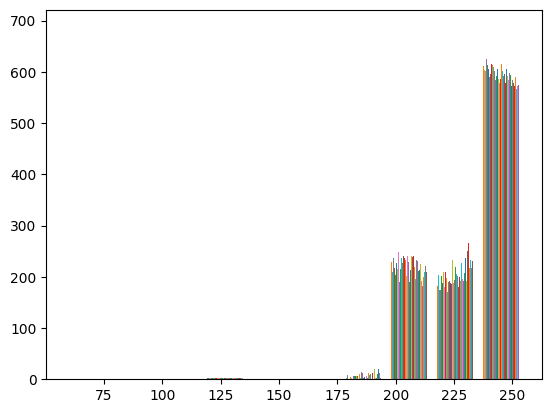

In [464]:
counts, edges, bars = plt.hist(reconstructed_image)

counts_final = []
for i in range (0, 10):
    add = 0
    for j in range(len(counts)):
        add = counts[j][i] +add
    counts_final.append(add)
for i in range(len(counts_final)):
    print(f"Bin {i + 1}: Range {edges[i]:.2f} to {edges[i + 1]:.2f}, Count: {counts_final[i]}")


In [465]:
reconstructed_image.shape

(1024, 1024)

In [470]:
def threshold_and_binary(image, threshold):
    width, length = image.shape
    new_image = np.zeros((width, length), dtype='uint8')
    for i in range(0,width):
           for j in range(0,length):
                if image[i,j] > threshold:
                    new_image[i,j] = 255
                else:
                    new_image[i,j] = 0
    return new_image

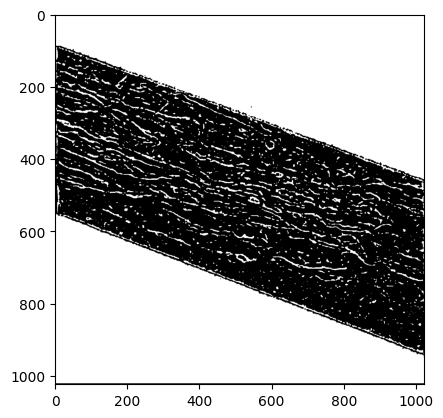

In [476]:
plt.imshow(threshold_and_binary(reconstructed_image,235),cmap = 'gray')

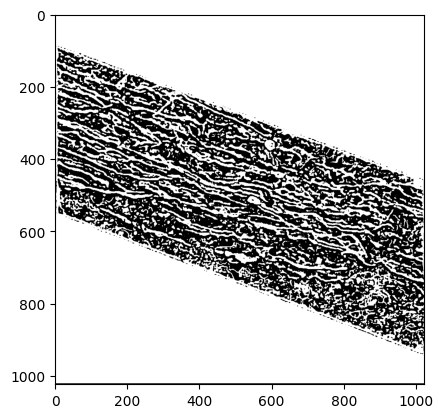

In [472]:
plt.imshow(threshold_and_binary(reconstructed_image,225),cmap = 'gray')

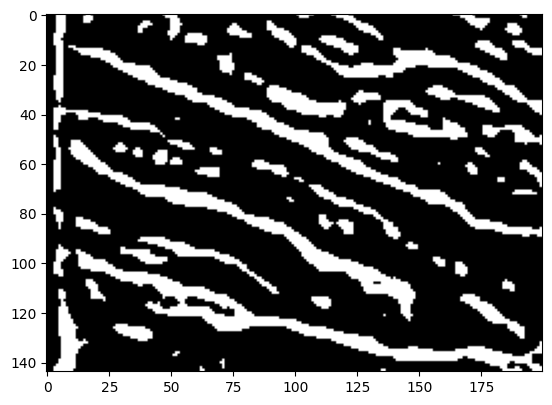

In [425]:
plt.imshow(threshold_and_binary(reconstructed_image,230)[356:500,0:200],cmap = 'gray')

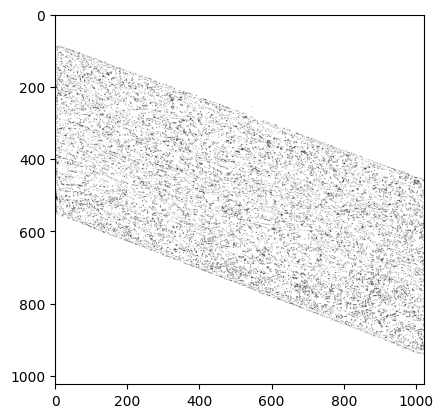

In [435]:
plt.imshow(threshold_and_binary(reconstructed_image,230),cmap = 'gray')

In [433]:
threshold_and_binary(reconstructed_image,230)[0:80,0:200]

True

In [462]:
reconstructed_image[1,0:10]

array([ 99, 168, 199, 207, 207, 207, 207, 207, 207, 207], dtype=uint8)

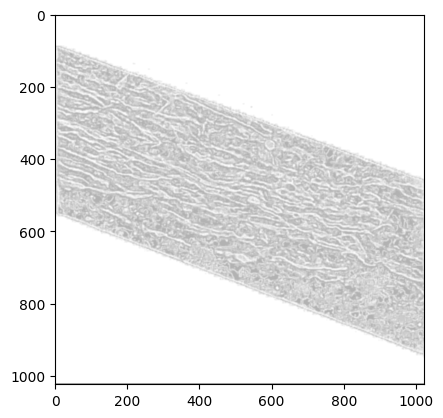

In [440]:
plt.imshow(reconstructed_image,cmap = 'gray')